<a id='b1'> </a>
<a id='c1'> </a>
<a id='d1'> </a>
<a id='e1'> </a>
### INDICE
#### [1- IMPORTACIÓN Y LIMPIEZA DE BASES](#a)
#### [2- GENERACIÓN DE FEATURES](#b)
#### [3- MACHINE LEARNING - CLUSTERING](#c)
#### [4- CONCLUSIONES](#d)
#### [5- PIPELINE](#e)

<a id='a'> </a> 
## 1- IMPORTACIÓN Y LIMPIEZA DE BASES
#### Lo primero que hago es importar todas las librerías que usare a lo largo de la Notebook.

In [1]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import plotly.express as px
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
from bokeh.plotting import figure
from bokeh.io import show, output_notebook
from bokeh.models import HoverTool
from bokeh.models import ColumnDataSource
import math
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import binarize
from sklearn.model_selection import cross_val_score, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import SCORERS
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples
from sklearn.metrics import calinski_harabasz_score
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster
from scipy.spatial.distance import pdist
from scipy.cluster import hierarchy 
from sklearn.cluster import DBSCAN
from scipy.spatial.distance import pdist,squareform
import matplotlib.cm as cm
from sklearn.decomposition import PCA
from sklearn.datasets import load_digits
from sklearn.pipeline import make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import FeatureUnion, Pipeline,make_union
from sklearn.compose import make_column_transformer,make_column_selector, ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
import pickle

#### Continuo por importar las bases:  

In [2]:
location1 = "C:/Users/Julian/Documents/Data Science/Desafío 4/Base_Venta.csv"
location2 = "C:/Users/Julian/Documents/Data Science/Desafío 4/Base_Clientes.csv"
location3 = "C:/Users/Julian/Documents/Data Science/Desafío 4/Calibre Envases.csv"
location4 = "C:/Users/Julian/Documents/Data Science/Desafío 4/Marca Segmento.csv"

venta = pd.read_csv(location1, delimiter = ";", decimal= "," , thousands=".")
clientes = pd.read_csv(location2,delimiter = ";")
Envases = pd.read_csv(location3,delimiter = ";")
Segmentos = pd.read_csv(location4,delimiter = ";")

In [3]:
venta.head()

,Año Mes Cierre,Alias Cliente Id,Marca,Calibre,Suma de #HL Vta Bruta,Suma de $ Fact
0,202102,67,Andrea Ipa,473 cc latas,0.05676,1013.85
1,202102,67,Andrea Rubia,473 cc latas,0.11352,1713.15
2,202102,67,Bruna,1000 cc vidrio,0.60000,6122.25
3,202102,67,Bruna,473 cc latas,0.11352,1490.40
4,202102,67,Estrella,1000 cc vidrio,0.11700,1710.45


In [4]:
venta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 767849 entries, 0 to 767848
Data columns (total 6 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Año Mes Cierre         767849 non-null  int64  
 1   Alias Cliente Id       767849 non-null  int64  
 2   Marca                  767849 non-null  object 
 3   Calibre                767849 non-null  object 
 4   Suma de #HL Vta Bruta  767849 non-null  float64
 5   Suma de $ Fact         767849 non-null  float64
dtypes: float64(2), int64(2), object(2)
memory usage: 35.1+ MB


#### La base "VENTA" contiene las compras de cada cliente en los últimos 6 meses.
#### Columna 1: Indica el mes en que se hizo la compra.
#### Columna 2: Indica el Código de identificación del cliente. Este es único para cada cliente.
#### Columna 3: Indica la Marca de la cerveza comprada.
#### Columna 4: Indica el calibre (tamaño y material del envase) de la cerveza comprada.
#### Columna 5: Indica la cantidad de hectolitros que se compraron. Esta es la principal unidad de medida utilizada por la empresa, antes que cantidad bultos. 0,12HL = 1 cajon de 1L retornable) 
#### Columna 6: Indica el importe abonado en pesos AR.
#### Veo que cada una de las 770 mil filas de la base representa la compra de un cliente de cada Marca, de cada Calibre por mes.

In [5]:
venta.rename(columns={"Año Mes Cierre": "Fecha","Alias Cliente Id": "Cliente ID", "Suma de #HL Vta Bruta": "Hectolitros", "Suma de $ Fact": "Facturacion" }, inplace = True)

#### Modificamos los nombres de las columnas según lo mencionado antes.

In [6]:
venta.describe()

,Fecha,Cliente ID,Hectolitros,Facturacion
count,767849.000000,767849.000000,767849.000000,7.678490e+05
mean,202104.410120,400180.153966,0.487837,6.505683e+03
std,1.729611,140023.738149,3.906434,4.747560e+04
min,202102.000000,10.000000,0.002690,-1.078650e+05
25%,202103.000000,368019.000000,0.056760,9.922500e+02
50%,202104.000000,413033.000000,0.120000,1.921730e+03
75%,202106.000000,436599.000000,0.244800,4.228210e+03
max,202107.000000,900118.000000,668.760000,8.331255e+06


#### En primera instancia puedo ver clientes con compras muy dispares que van desde 0,003HL hasta los 669. Pero si veo como un 75% de las compras está por debajo de los 0,25HL=2 cajones de cerveza de litro.

<AxesSubplot:>

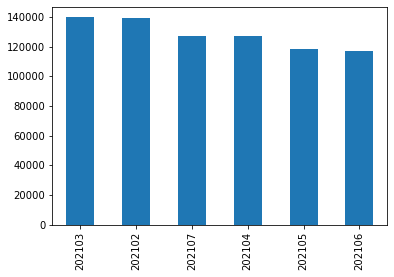

In [7]:
venta['Fecha'].value_counts(sort=True).plot.bar()

#### Tal como supuse, puedo observar que la distribución de los 770 mil registros muestra una estacionalidad negativa hacia el invierno

In [8]:
venta['Cliente ID'].nunique()

24598

#### Observo que en los últimos 6 meses hubieron 24.598 clientes compradores

In [9]:
clientes.head()

,Alias Cliente Id,Ciudad,Localidad 12,Canal,Perfil Impositivo,Fecha de Alta,Fecha de Baja,Estado
0,67,Ciudad 1,Localidad 12,Tradicional,Inscripto,12/10/1994,31/12/9999,Activo
1,115,Ciudad 1,Localidad 12,Tradicional,Inscripto,12/10/1994,31/12/9999,Activo
2,148,Ciudad 1,Localidad 12,Tradicional,Inscripto,12/10/1994,31/12/9999,Activo
3,361,Ciudad 1,Localidad 12,Tradicional,Inscripto,02/11/1994,31/12/9999,Activo
4,449,Ciudad 1,Localidad 12,Tradicional,Inscripto,12/10/1994,31/12/1999,Activo


#### La base "CLENTES" dispone del maestro de clientes ciertos datos de cada cliente.
#### Columna 1: Indica el Código de identificación del cliente. Este es único para cada cliente.
#### Columna 2: Indica la ciudad en la que se encuentra el cliente.
#### Columna 3: Indica la localidad en la que se encuentra el cliente.
#### Columan 4: Indica el Canal al que pertenece el cliente. 
#### Columna 5: Indica si el cliente se encuentra inscripto en la AFIP o no. La Compañia es un agente retensor de IVA, por lo cual, a los clientes No inscriptos, se les deben persibir los impuestos correspondientes, para luego acreditarse a la AFIP.
#### Columna 6: Indica la fecha en la que el cliente se dió de alta en el Sistema de la Compañia.
#### Columna 7: Indica la fecha en la que el cliente se dió se registro como "Cerrado definitivo" en el Sistema de la Compañia.
#### Columan 8: Indica si el cliente está actualmente activo o ya fue registrado como "Cerrado definitivo".
#### Tengo una fila para cada cliente y vemos los clientes Activos tienen una fecha de baja ficticia en el año 9999.

In [10]:
clientes.rename(columns={"Alias Cliente Id": "Cliente ID", "Localidad 12": "Localidad"}, inplace = True)

#### Modifico los nombres de las columnas según lo mencionado antes.

In [11]:
clientes['Fecha de Alta']=pd.to_datetime(clientes['Fecha de Alta'])

In [12]:
#clientes['Fecha de Baja']=pd.to_datetime(clientes['Fecha de Baja']) No reconoce los valores '31/|12/9999'

In [13]:
clientes.loc[clientes['Fecha de Baja'] == '31/12/9999','Fecha de Baja']='31/12/2022'

In [14]:
clientes['Fecha de Baja']=pd.to_datetime(clientes['Fecha de Baja'])
clientes.head()

,Cliente ID,Ciudad,Localidad,Canal,Perfil Impositivo,Fecha de Alta,Fecha de Baja,Estado
0,67,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
1,115,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
2,148,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
3,361,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-02-11,2022-12-31,Activo
4,449,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,1999-12-31,Activo


#### Llevo las fechas de alta y baja a un formato 'datetime' que luego va a permitir trabajar sobre este. 

In [15]:
clientes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24598 entries, 0 to 24597
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Cliente ID         24598 non-null  int64         
 1   Ciudad             24598 non-null  object        
 2   Localidad          24598 non-null  object        
 3   Canal              24598 non-null  object        
 4   Perfil Impositivo  24598 non-null  object        
 5   Fecha de Alta      24598 non-null  datetime64[ns]
 6   Fecha de Baja      24598 non-null  datetime64[ns]
 7   Estado             24598 non-null  object        
dtypes: datetime64[ns](2), int64(1), object(5)
memory usage: 1.5+ MB


In [16]:
clientes[clientes['Estado']=='Activo'].describe(datetime_is_numeric=True)

,Cliente ID,Fecha de Alta,Fecha de Baja
count,24384.000000,24384,24384
mean,406778.605807,2014-11-27 17:44:38.740157440,2026-03-26 19:43:13.700787456
min,10.000000,1980-01-01 00:00:00,1999-05-08 00:00:00
25%,366358.750000,2012-06-21 00:00:00,2022-12-31 00:00:00
50%,416062.500000,2017-03-11 00:00:00,2022-12-31 00:00:00
75%,438683.750000,2019-11-06 00:00:00,2022-12-31 00:00:00
max,900118.000000,2021-12-07 00:00:00,2040-12-31 00:00:00
std,149644.435444,NaN,NaN


#### Puedo observar 2 inconsistencias. En Fecha de Baja vemos que el valor mínimo es en el año 1999, pero, al haber filtrado solo por los clientes Activos, deberíamos tener solo fechas posteriores a la actual.
#### Luego en Fecha de Alta veo que el valor máximo es Diciembre de este año.
#### Corrijo las fechas de bajas con una fecha de baja ficticia y elimino los clientes con fechas de alta errones dadas que no tengo un modo de definir la fecha correcta.

In [17]:
maskfechabajamal = (clientes['Fecha de Baja']<pd.to_datetime('2021-08-01',format="%Y-%m-%d")) & (clientes['Estado'] == 'Activo')
clientes.loc[maskfechabajamal,'Fecha de Baja'] = pd.to_datetime('2022-12-31',format="%Y-%m-%d")
clientes[clientes['Estado']=='Activo'].describe(datetime_is_numeric=True)

,Cliente ID,Fecha de Alta,Fecha de Baja
count,24384.000000,24384,24384
mean,406778.605807,2014-11-27 17:44:38.740157440,2026-04-13 09:42:48.897637888
min,10.000000,1980-01-01 00:00:00,2022-12-31 00:00:00
25%,366358.750000,2012-06-21 00:00:00,2022-12-31 00:00:00
50%,416062.500000,2017-03-11 00:00:00,2022-12-31 00:00:00
75%,438683.750000,2019-11-06 00:00:00,2022-12-31 00:00:00
max,900118.000000,2021-12-07 00:00:00,2040-12-31 00:00:00
std,149644.435444,NaN,NaN


In [18]:
fechamal=clientes[clientes['Fecha de Alta'] > pd.to_datetime('2021-07-30',format="%Y-%m-%d")]
fechamal

,Cliente ID,Ciudad,Localidad,Canal,Perfil Impositivo,Fecha de Alta,Fecha de Baja,Estado
711,443903,Ciudad 1,Localidad 12,Tradicional,Inscripto,2021-11-01,2022-12-31,Activo
712,443924,Ciudad 1,Localidad 12,Tradicional,Inscripto,2021-11-01,2022-12-31,Activo
713,443934,Ciudad 1,Localidad 12,Tradicional,Inscripto,2021-11-01,2022-12-31,Activo
714,443961,Ciudad 1,Localidad 12,Tradicional,Inscripto,2021-12-01,2022-12-31,Activo
715,443964,Ciudad 1,Localidad 12,Tradicional,Inscripto,2021-12-01,2022-12-31,Activo
...,...,...,...,...,...,...,...,...
24511,445833,Ciudad 6,Localidad 4,Tradicional,No inscripto,2021-11-03,2022-12-31,Activo
24520,447519,Ciudad 6,Localidad 21,Refrigerado,Inscripto,2021-10-05,2022-12-31,Activo
24556,447626,Ciudad 7,Localidad 20,Tradicional,Inscripto,2021-12-05,2022-12-31,Activo
24559,448305,Ciudad 7,Localidad 20,Tradicional,Inscripto,2021-11-06,2022-12-31,Activo


In [19]:
clientesmal=fechamal['Cliente ID'].unique()

In [20]:
maskfechamal = venta['Cliente ID'].isin(clientesmal)

In [21]:
venta=venta[~maskfechamal]
venta.shape

(757896, 6)

In [176]:
round(clientes['Canal'].value_counts(normalize=True),2)

Tradicional     0.73
Kiosco          0.21
Refrigerado     0.03
Autoservicio    0.02
Mayorista       0.00
Name: Canal, dtype: float64

#### Como anticipabamos tengo más de un 90% de los clientes que pertenecen al K+T 

In [23]:
maskKT = (clientes.Canal == 'Tradicional') | (clientes.Canal == 'Kiosco')
clientesKT = clientes[maskKT]
clientesKT.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23158 entries, 0 to 24597
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Cliente ID         23158 non-null  int64         
 1   Ciudad             23158 non-null  object        
 2   Localidad          23158 non-null  object        
 3   Canal              23158 non-null  object        
 4   Perfil Impositivo  23158 non-null  object        
 5   Fecha de Alta      23158 non-null  datetime64[ns]
 6   Fecha de Baja      23158 non-null  datetime64[ns]
 7   Estado             23158 non-null  object        
dtypes: datetime64[ns](2), int64(1), object(5)
memory usage: 1.6+ MB


In [24]:
clientesKT.nunique()

Cliente ID           23158
Ciudad                   8
Localidad              182
Canal                    2
Perfil Impositivo        2
Fecha de Alta         4427
Fecha de Baja           88
Estado                   2
dtype: int64

<AxesSubplot:>

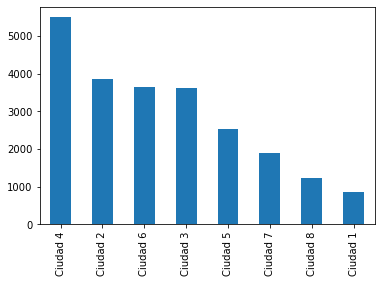

In [25]:
clientesKT['Ciudad'].value_counts(sort=True).plot.bar()

<AxesSubplot:>

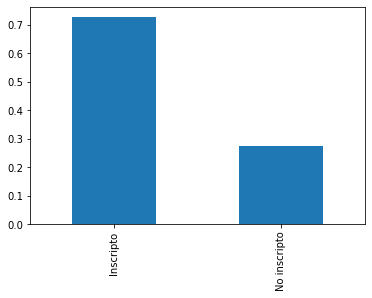

In [26]:
clientesKT['Perfil Impositivo'].value_counts(normalize=True).plot.bar()

#### Puedo ver que más del 70% de los clientes se encuentran inscriptos

In [27]:
clientesKT['Estado'].value_counts()

Activo      22964
Inactivo      194
Name: Estado, dtype: int64

In [28]:
Envases

,Calibre,Unnamed: 1
0,1000 cc vidrio,Familiar
1,1200 cc vidrio,Familiar
2,269 cc lata,Individual
3,330 cc vidrio,Individual
4,340 cc ret,Individual
5,354 cc lata,Individual
6,473 cc latas,Individual
7,700 cc vidrio,Familiar
8,970 cc vidrio,Familiar
9,barril 20 lt,Familiar


#### La base "ENVASES" contiene un DE-PARA que indica cada calibre si pertenece a un formato 'Individual' o 'Familiar'.

In [29]:
Envases.rename(columns={"Unnamed: 1": "Envases"}, inplace = True)
Envases

,Calibre,Envases
0,1000 cc vidrio,Familiar
1,1200 cc vidrio,Familiar
2,269 cc lata,Individual
3,330 cc vidrio,Individual
4,340 cc ret,Individual
5,354 cc lata,Individual
6,473 cc latas,Individual
7,700 cc vidrio,Familiar
8,970 cc vidrio,Familiar
9,barril 20 lt,Familiar


In [30]:
Segmentos.head(10)

,Marca,Segmento
0,Ana,Core
1,Andrea Uva,Core Plus
2,Andrea Ipa,Core Plus
3,Andrea Miel,Core Plus
4,Andrea Negra,Core Plus
5,Andrea Roja,Core Plus
6,Andrea Rubia,Core Plus
7,Andrea Trigo,Core Plus
8,Ana Negra,Core
9,Balada,Value


In [31]:
Segmentos['Segmento'].value_counts()

Premium      19
Core         14
Core Plus     8
Value         4
No            1
Name: Segmento, dtype: int64

In [32]:
Segmentos[Segmentos['Segmento']=='No']

,Marca,Segmento
39,No,No


#### En la base "SEGMENTOS" encuentro otro DE-PARA que indica para cada una de las 46 marcas comercializadas a que Segmento pertenece: 
#### Premium - Es el segmento de marcas en el cual la compañia tiene mejor MACO
#### Core Plus - Es un segmento intermedio que busca brindar mejores experiencias al consumidor, por un precio más bajo
#### Core - Es el segmento de más volumen de la compañia
#### Value - Son ofertas más económicas
#### A medida que bajo en los segmentos, también lo hacen los precios de las marcas.
#### 

#### Ahora junto las distintas tablas de Venta, Clientes, Envases & Segmentos. Luego generaremos tablas que nos permitan tener un mejor entendimiento de la informacion.

In [33]:
dfventa = venta.merge(right=Envases.reset_index()[['Calibre','Envases']].drop_duplicates(), on='Calibre', how='left')

In [34]:
dfventa = dfventa.merge(right=Segmentos.reset_index()[['Marca','Segmento']].drop_duplicates(), on='Marca', how='left')

In [35]:
dfventa = dfventa.merge(right=clientes.reset_index()[['Cliente ID','Ciudad','Localidad','Canal','Perfil Impositivo','Fecha de Alta','Fecha de Baja','Estado']].drop_duplicates(), on='Cliente ID', how='left')

In [36]:
dfventa.head(10)

,Fecha,Cliente ID,Marca,Calibre,Hectolitros,Facturacion,Envases,Segmento,Ciudad,Localidad,Canal,Perfil Impositivo,Fecha de Alta,Fecha de Baja,Estado
0,202102,67,Andrea Ipa,473 cc latas,0.05676,1013.85,Individual,Core Plus,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
1,202102,67,Andrea Rubia,473 cc latas,0.11352,1713.15,Individual,Core Plus,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
2,202102,67,Bruna,1000 cc vidrio,0.60000,6122.25,Familiar,Core,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
3,202102,67,Bruna,473 cc latas,0.11352,1490.40,Individual,Core,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
4,202102,67,Estrella,1000 cc vidrio,0.11700,1710.45,Familiar,Premium,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
5,202102,67,Estrella,473 cc latas,0.11352,2027.70,Individual,Premium,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
6,202102,67,Maria Lager,1000 cc vidrio,0.36000,3511.35,Familiar,Core,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
7,202102,67,Maria Lager,473 cc latas,0.22704,2770.20,Individual,Core,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
8,202102,67,Maria liviana,1000 cc vidrio,0.60000,5325.75,Familiar,Core,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
9,202102,67,Maria Stout,473 cc latas,0.22704,2770.20,Individual,Core,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo


In [37]:
maskact =(dfventa.Estado == 'Activo')
dfventa = dfventa[maskact]
dfventa.head()

,Fecha,Cliente ID,Marca,Calibre,Hectolitros,Facturacion,Envases,Segmento,Ciudad,Localidad,Canal,Perfil Impositivo,Fecha de Alta,Fecha de Baja,Estado
0,202102,67,Andrea Ipa,473 cc latas,0.05676,1013.85,Individual,Core Plus,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
1,202102,67,Andrea Rubia,473 cc latas,0.11352,1713.15,Individual,Core Plus,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
2,202102,67,Bruna,1000 cc vidrio,0.60000,6122.25,Familiar,Core,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
3,202102,67,Bruna,473 cc latas,0.11352,1490.40,Individual,Core,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo
4,202102,67,Estrella,1000 cc vidrio,0.11700,1710.45,Familiar,Premium,Ciudad 1,Localidad 12,Tradicional,Inscripto,1994-12-10,2022-12-31,Activo


In [38]:
data = dfventa[['Cliente ID','Canal']].value_counts().reset_index()
data = data.drop(columns = [0])
data.head()

,Cliente ID,Canal
0,410375,Tradicional
1,428859,Kiosco
2,415342,Kiosco
3,364696,Tradicional
4,435368,Tradicional


In [39]:
data['Canal'].value_counts(normalize=True)

Tradicional     0.728004
Kiosco          0.213952
Refrigerado     0.030523
Autoservicio    0.024143
Mayorista       0.003378
Name: Canal, dtype: float64

In [40]:
tablacanal = data['Canal'].value_counts().reset_index().rename(columns={"index": "Canal","Canal": "# Clientes" })
tablacanal.head()

,Canal,# Clientes
0,Tradicional,17459
1,Kiosco,5131
2,Refrigerado,732
3,Autoservicio,579
4,Mayorista,81


In [41]:
tablaventa= dfventa.groupby(by=['Canal'])[['Hectolitros','Facturacion']].sum().reset_index()
tablaventa.head()

,Canal,Hectolitros,Facturacion
0,Autoservicio,20102.40919,2.566478e+08
1,Kiosco,67478.17402,9.002821e+08
2,Mayorista,17789.93332,1.742428e+08
3,Refrigerado,21191.68754,3.104508e+08
4,Tradicional,237787.92117,3.208013e+09


In [42]:
round(tablaventa['Facturacion']/tablaventa['Facturacion'].sum(),2)

0    0.05
1    0.19
2    0.04
3    0.06
4    0.66
Name: Facturacion, dtype: float64

In [43]:
round(tablaventa['Hectolitros']/tablaventa['Hectolitros'].sum(),2)

0    0.06
1    0.19
2    0.05
3    0.06
4    0.65
Name: Hectolitros, dtype: float64

''

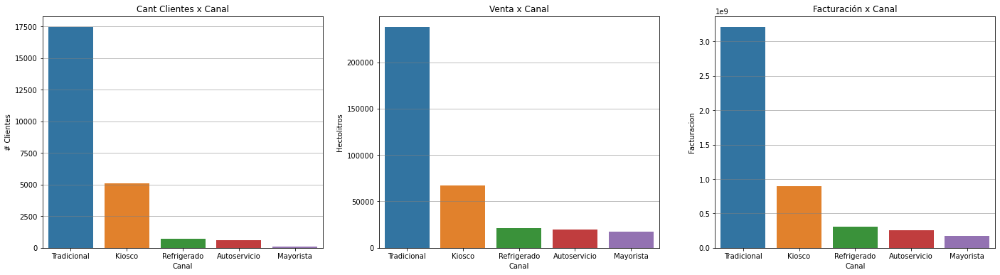

In [44]:
fig, axs = plt.subplots(1,3,figsize=(24,6))
axs[0].set(xlabel = "Canal", ylabel = "Cant Clientes", title = "Cant Clientes x Canal")
axs[1].set(xlabel = "Canal", ylabel = "Venta HL", title = "Venta x Canal")
axs[2].set(xlabel = "Canal", ylabel = "Fact $", title = "Facturación x Canal")
axs[0].grid(axis='y', color='gray', linewidth=0.5)
axs[1].grid(axis='y', color='gray', linewidth=0.5)
axs[2].grid(axis='y', color='gray', linewidth=0.5)

sns.barplot(ax=axs[0], data= tablacanal, x='Canal',y='# Clientes',order=['Tradicional','Kiosco','Refrigerado','Autoservicio','Mayorista'])
#axs[1] = tablaventa.plot.bar(stacked=True)
sns.barplot(ax=axs[1],data=tablaventa,x='Canal',y='Hectolitros',order=['Tradicional','Kiosco','Refrigerado','Autoservicio','Mayorista'])
sns.barplot(ax=axs[2],data=tablaventa,x='Canal',y='Facturacion',order=['Tradicional','Kiosco','Refrigerado','Autoservicio','Mayorista'])
;

#### Tal como vengo mencioanndo acá puedo ver como los clientes de K+T son la mayoría y representan la mayor parte de la venta de la Compañia.

In [45]:
# Dejar solo K+T
maskKT =(dfventa.Canal == 'Tradicional') | (dfventa.Canal == 'Kiosco')
dfventakt = dfventa[maskKT]
dfventakt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 708888 entries, 0 to 757895
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   Fecha              708888 non-null  int64         
 1   Cliente ID         708888 non-null  int64         
 2   Marca              708888 non-null  object        
 3   Calibre            708888 non-null  object        
 4   Hectolitros        708888 non-null  float64       
 5   Facturacion        708888 non-null  float64       
 6   Envases            708888 non-null  object        
 7   Segmento           708888 non-null  object        
 8   Ciudad             708888 non-null  object        
 9   Localidad          708888 non-null  object        
 10  Canal              708888 non-null  object        
 11  Perfil Impositivo  708888 non-null  object        
 12  Fecha de Alta      708888 non-null  datetime64[ns]
 13  Fecha de Baja      708888 non-null  datetime

In [46]:
dfventakt['Cliente ID'].nunique()

22590

In [47]:
tablaventa2= dfventakt.groupby(by=['Fecha','Canal'])[['Hectolitros','Facturacion']].sum().reset_index()
tablaventa2.head()

,Fecha,Canal,Hectolitros,Facturacion
0,202102,Kiosco,14177.90823,1.666090e+08
1,202102,Tradicional,51262.58897,6.001030e+08
2,202103,Kiosco,14420.79716,1.691902e+08
3,202103,Tradicional,55073.24195,6.408697e+08
4,202104,Kiosco,12019.81792,1.367654e+08


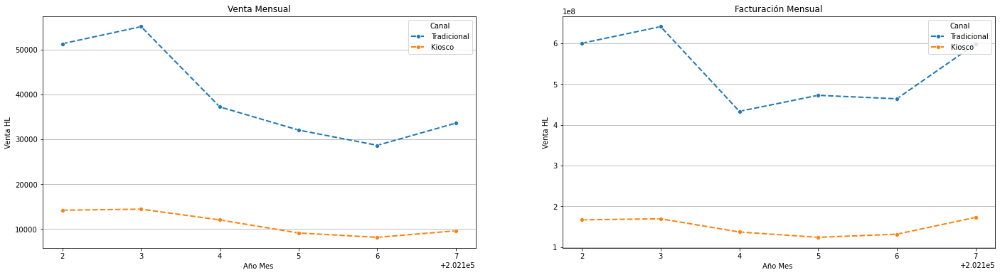

In [48]:
fig, axs = plt.subplots(1,2, figsize=(24, 6), sharex=True)
axs[0].set(xlabel = "Año Mes ", ylabel = "Venta HL", title = "Venta Mensual")
axs[1].set(xlabel = "Año Mes ", ylabel = "Venta HL", title = "Facturación Mensual")
axs[0].grid(axis='y', color='gray', linewidth=0.5)
axs[1].grid(axis='y', color='gray', linewidth=0.5)

sns.lineplot(ax=axs[0], data= tablaventa2[tablaventa2['Canal']=='Tradicional'], x='Fecha',y='Hectolitros',marker='o',label='Tradicional',linestyle='dashed',linewidth=2)
sns.lineplot(ax=axs[0], data= tablaventa2[tablaventa2['Canal']=='Kiosco'], x='Fecha',y='Hectolitros',marker='o',label='Kiosco',linestyle='dashed',linewidth=2)
sns.lineplot(ax=axs[1], data= tablaventa2[tablaventa2['Canal']=='Tradicional'], x='Fecha',y='Facturacion',marker='o',label='Tradicional',linestyle='dashed',linewidth=2)
sns.lineplot(ax=axs[1], data= tablaventa2[tablaventa2['Canal']=='Kiosco'], x='Fecha',y='Facturacion',marker='o',label='Kiosco',linestyle='dashed',linewidth=2)
#sns.lineplot(ax=axs[0], data= tablaventa[tablaventa['Canal'=='Kiosco']], x='Fecha',y='Hectolitros',order=['202102','202103','202104','202105','202106','202107'])



            
#axs[0].plot(dfventa['Hectolitros'][dfventa.Canal == 'Tradicional'] , color = 'g',linestyle='dashed',marker= 'o',label='Tradicional')
#axs[0].plot(dfventa['Hectolitros'][dfventa.Canal == 'Kiosco'] , color = 'b',linestyle='dashed',marker= 'o',label='Kiosco')
axs[0].legend(loc='upper right', title = "Canal")
axs[1].legend(loc='upper right', title = "Canal")
#ax.set_ylim(-5, 10)

#### Similar a lo que mencionaba antes, la caida de volumen hacia el invierno, producto de la estacionalidad del Mercado. Aún así no veo ese efecto en la Facturación debido a un aumento de precios efectuado a principios de Mayo.

<a id='b'> </a>
## 2- GENERACIÓN DE FEATURES
##### [Indice](#b1)
#### 
#### Parto de Datafreme 'data' en el cual ya tengo los clientes Activos del K+T 

In [49]:
data.head()

,Cliente ID,Canal
0,410375,Tradicional
1,428859,Kiosco
2,415342,Kiosco
3,364696,Tradicional
4,435368,Tradicional


#### Agrego los atributos iniciales de cada cliente

In [50]:
data = data.merge(right=dfventa.reset_index()[['Cliente ID','Ciudad','Localidad','Perfil Impositivo','Fecha de Alta']].drop_duplicates(), on='Cliente ID', how='left')
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03


#### Ahora genero una nueva feature que me indique hace cuantos meses está activo el cliente.
#### Dado que luego voy a ver las compras como promedios mensuales, ahora me quedo con los clientes que tengan por lo menos un mes completo desde que su alta.

In [51]:
Antiguedad = pd.to_datetime('2021-08-01',format="%Y-%m-%d") - data['Fecha de Alta']
data['Antiguedad'] = round(Antiguedad / np.timedelta64(1,'M')) 
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0


In [52]:
data['Cliente ID'].nunique()

23982

In [53]:
data = data[data['Antiguedad'] > 0 ]
data.describe()

,Cliente ID,Antiguedad
count,23917.000000,23917.000000
mean,406001.546724,81.719154
std,150993.811403,86.767193
min,10.000000,1.000000
25%,365101.000000,22.000000
50%,414442.000000,54.000000
75%,437955.000000,111.000000
max,900118.000000,499.000000


In [54]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23917 entries, 0 to 23981
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Cliente ID         23917 non-null  int64         
 1   Canal              23917 non-null  object        
 2   Ciudad             23917 non-null  object        
 3   Localidad          23917 non-null  object        
 4   Perfil Impositivo  23917 non-null  object        
 5   Fecha de Alta      23917 non-null  datetime64[ns]
 6   Antiguedad         23917 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(4)
memory usage: 1.5+ MB


#### El proximo feature será identificar cuantos de los últimos 6 meses, cada cliente compro a la compañia

In [55]:
tablamesescc= dfventa.groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
tablamesescc.head()

,Cliente ID,Fecha,Hectolitros,Facturacion
0,10,202102,1.398,17394.75
1,10,202103,1.800,21979.35
2,10,202104,1.200,14652.90
3,10,202105,1.080,18581.40
4,10,202106,1.320,22578.75


In [56]:
MesesConCompra = tablamesescc['Cliente ID'].value_counts().reset_index().rename(columns={"index": "Cliente ID","Cliente ID": "Meses c/ Compra" })
MesesConCompra

,Cliente ID,Meses c/ Compra
0,399357,6
1,418149,6
2,412128,6
3,373215,6
4,368368,6
...,...,...
23977,67128,1
23978,810515,1
23979,173452,1
23980,392551,1


In [57]:
data = data.merge(right=MesesConCompra.reset_index()[['Cliente ID','Meses c/ Compra']].drop_duplicates(), on='Cliente ID', how='left')
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6


In [58]:
data['Meses c/ Compra'].value_counts(normalize=True,sort=False)

1    0.088013
2    0.086089
3    0.091316
4    0.100807
5    0.138646
6    0.495129
Name: Meses c/ Compra, dtype: float64

#### Encuentro que casí el 50% de los clientes reliazaron compras constantemente durante los 6 meses
#### 
#### A continuación calculo el volumen y facturación promedio mensual de cada cliente.

In [59]:
tablatotal= dfventa.groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
tablatotal=round(tablatotal.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablatotal.head()

,Hectolitros,Facturacion
Cliente ID,,
10,1.41,21135.38
65,0.31,4545.06
67,1.72,24471.91
115,1.68,23763.72
145,0.18,2539.01


In [60]:
data = data.merge(right=tablatotal.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
data.rename(columns={"Hectolitros": "Prom Vol Total","Facturacion": "Prom Fact Total"}, inplace = True)
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58


In [61]:
data.describe()

,Cliente ID,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total
count,23917.000000,23917.000000,23917.000000,23917.000000,2.391700e+04
mean,406001.546724,81.719154,4.601371,2.812274,3.768484e+04
std,150993.811403,86.767193,1.727839,12.161373,1.538386e+05
min,10.000000,1.000000,1.000000,0.000000,0.000000e+00
25%,365101.000000,22.000000,3.000000,0.330000,4.624420e+03
50%,414442.000000,54.000000,5.000000,0.820000,1.155735e+04
75%,437955.000000,111.000000,6.000000,2.070000,2.912400e+04
max,900118.000000,499.000000,6.000000,721.150000,8.713774e+06


#### Ahora calculo el volumen y facturación promedio mensual pero lo veo para cada segmento

In [62]:
tablaPrem= dfventa[dfventa['Segmento'] == 'Premium'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
tablaPrem=round(tablaPrem.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablaPrem.head()

,Hectolitros,Facturacion
Cliente ID,,
65,0.10,2308.34
67,0.33,6142.64
115,1.02,15557.63
148,0.23,5329.13
361,0.40,10286.27


In [63]:
data = data.merge(right=tablaPrem.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
data.rename(columns={"Hectolitros": "Prom Vol Prem","Facturacion": "Prom Fact Prem"}, inplace = True)
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,Prom Vol Prem,Prom Fact Prem
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,6.74,130219.26
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,4.85,97473.50
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,7.49,148974.76
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,5.70,97293.34
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,4.35,78366.62


In [64]:
tablacoreplus= dfventa[dfventa['Segmento'] == 'Core Plus'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
tablacoreplus=round(tablacoreplus.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablacoreplus.head()

,Hectolitros,Facturacion
Cliente ID,,
67,0.51,8623.58
115,0.23,4503.94
148,0.38,7302.04
361,0.11,2188.35
445,0.26,5014.24


In [65]:
data = data.merge(right=tablacoreplus.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
data.rename(columns={"Hectolitros": "Prom Vol Core Plus","Facturacion": "Prom Fact Core Plus"}, inplace = True)
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,Prom Vol Prem,Prom Fact Prem,Prom Vol Core Plus,Prom Fact Core Plus
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,6.74,130219.26,8.27,104756.30
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,4.85,97473.50,9.05,114292.58
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,7.49,148974.76,5.36,72355.50
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,5.70,97293.34,7.87,92721.32
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,4.35,78366.62,5.37,83735.96


In [66]:
tablacore= dfventa[dfventa['Segmento'] == 'Core'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
tablacore=round(tablacore.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablacore.head()

,Hectolitros,Facturacion
Cliente ID,,
10,1.41,21135.38
65,0.29,3607.41
67,0.94,10729.46
115,1.60,19687.05
145,0.18,2539.01


In [67]:
data = data.merge(right=tablacore.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
data.rename(columns={"Hectolitros": "Prom Vol Core","Facturacion": "Prom Fact Core"}, inplace = True)
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,Prom Vol Prem,Prom Fact Prem,Prom Vol Core Plus,Prom Fact Core Plus,Prom Vol Core,Prom Fact Core
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,6.74,130219.26,8.27,104756.30,7.20,74887.76
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,4.85,97473.50,9.05,114292.58,6.65,76491.68
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,7.49,148974.76,5.36,72355.50,5.40,64049.18
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,5.70,97293.34,7.87,92721.32,8.41,90496.69
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,4.35,78366.62,5.37,83735.96,6.01,71516.75


In [68]:
tablavalue= dfventa[dfventa['Segmento'] == 'Value'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
tablavalue=round(tablavalue.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablavalue.head()

,Hectolitros,Facturacion
Cliente ID,,
1985,0.24,2130.30
9678,0.24,2146.50
10777,0.12,1065.15
18007,0.12,1065.15
18399,0.30,2926.80


In [69]:
data = data.merge(right=tablavalue.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
data.rename(columns={"Hectolitros": "Prom Vol Value","Facturacion": "Prom Fact Value"}, inplace = True)
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,Prom Vol Prem,Prom Fact Prem,Prom Vol Core Plus,Prom Fact Core Plus,Prom Vol Core,Prom Fact Core,Prom Vol Value,Prom Fact Value
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,6.74,130219.26,8.27,104756.30,7.20,74887.76,0.35,4260.60
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,4.85,97473.50,9.05,114292.58,6.65,76491.68,0.26,3365.55
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,7.49,148974.76,5.36,72355.50,5.40,64049.18,NaN,NaN
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,5.70,97293.34,7.87,92721.32,8.41,90496.69,NaN,NaN
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,4.35,78366.62,5.37,83735.96,6.01,71516.75,0.28,2488.50


#### Repeto el calculo de volumen y facturación promedio mensual pero ahora separando los envases Familiares e Individuales

In [70]:
tablafam= dfventa[dfventa['Envases'] == 'Familiar'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
tablafam=round(tablafam.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablafam.head()

,Hectolitros,Facturacion
Cliente ID,,
10,1.39,20619.23
65,0.24,2454.30
67,1.28,17182.58
115,1.26,19521.00
145,0.18,2365.20


In [71]:
data = data.merge(right=tablafam.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
data.rename(columns={"Hectolitros": "Prom Vol Fam","Facturacion": "Prom Fact Fam"}, inplace = True)
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,Prom Vol Prem,Prom Fact Prem,Prom Vol Core Plus,Prom Fact Core Plus,Prom Vol Core,Prom Fact Core,Prom Vol Value,Prom Fact Value,Prom Vol Fam,Prom Fact Fam
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,6.74,130219.26,8.27,104756.30,7.20,74887.76,0.35,4260.60,10.72,132008.40
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,4.85,97473.50,9.05,114292.58,6.65,76491.68,0.26,3365.55,4.58,58550.85
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,7.49,148974.76,5.36,72355.50,5.40,64049.18,NaN,NaN,4.95,72497.02
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,5.70,97293.34,7.87,92721.32,8.41,90496.69,NaN,NaN,6.75,82514.70
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,4.35,78366.62,5.37,83735.96,6.01,71516.75,0.28,2488.50,11.10,155963.03


In [72]:
tablaind= dfventa[dfventa['Envases'] == 'Individual'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
tablaind=round(tablaind.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablaind.head()

,Hectolitros,Facturacion
Cliente ID,,
10,0.11,3096.90
65,0.27,4136.02
67,0.44,7289.33
115,1.48,18245.93
145,0.12,1750.61


In [73]:
data = data.merge(right=tablaind.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
data.rename(columns={"Hectolitros": "Prom Vol Ind","Facturacion": "Prom Fact Ind"}, inplace = True)
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Prom Vol Core Plus,Prom Fact Core Plus,Prom Vol Core,Prom Fact Core,Prom Vol Value,Prom Fact Value,Prom Vol Fam,Prom Fact Fam,Prom Vol Ind,Prom Fact Ind
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,8.27,104756.30,7.20,74887.76,0.35,4260.60,10.72,132008.40,11.61,179275.12
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,9.05,114292.58,6.65,76491.68,0.26,3365.55,4.58,58550.85,16.05,230828.76
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,5.36,72355.50,5.40,64049.18,NaN,NaN,4.95,72497.02,13.30,212882.40
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,7.87,92721.32,8.41,90496.69,NaN,NaN,6.75,82514.70,15.23,197996.65
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,5.37,83735.96,6.01,71516.75,0.28,2488.50,11.10,155963.03,4.77,78900.56


In [74]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23917 entries, 0 to 23916
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Cliente ID           23917 non-null  int64         
 1   Canal                23917 non-null  object        
 2   Ciudad               23917 non-null  object        
 3   Localidad            23917 non-null  object        
 4   Perfil Impositivo    23917 non-null  object        
 5   Fecha de Alta        23917 non-null  datetime64[ns]
 6   Antiguedad           23917 non-null  float64       
 7   Meses c/ Compra      23917 non-null  int64         
 8   Prom Vol Total       23917 non-null  float64       
 9   Prom Fact Total      23917 non-null  float64       
 10  Prom Vol Prem        19448 non-null  float64       
 11  Prom Fact Prem       19448 non-null  float64       
 12  Prom Vol Core Plus   18582 non-null  float64       
 13  Prom Fact Core Plus  18582 non-

#### Ahora calculo que parte del volumen y facturación de compra de cada cliente de marcas Premium y/o Core Plus. Lo llamo 'Mix Above Core'

In [75]:
tablamix= dfventa.pivot_table(index='Cliente ID', columns='Segmento',values='Hectolitros',aggfunc='sum',margins=True)
tablamix

Segmento,Core,Core Plus,Premium,Value,All
Cliente ID,,,,,
10,8.47152,NaN,NaN,NaN,8.47152
65,1.43196,NaN,0.41976,NaN,1.85172
67,5.62548,3.06816,1.64316,NaN,10.33680
115,3.19800,0.45936,3.06936,NaN,6.72672
145,1.09788,NaN,NaN,NaN,1.09788
...,...,...,...,...,...
899925,6.02034,NaN,NaN,NaN,6.02034
899928,0.26838,NaN,NaN,NaN,0.26838
900106,0.85440,NaN,NaN,NaN,0.85440


In [76]:
tablamix['Mix Vol Above Core'] = (tablamix['Premium'] + tablamix['Core Plus']) / tablamix['All']
tablamix

Segmento,Core,Core Plus,Premium,Value,All,Mix Vol Above Core
Cliente ID,,,,,,
10,8.47152,NaN,NaN,NaN,8.47152,NaN
65,1.43196,NaN,0.41976,NaN,1.85172,NaN
67,5.62548,3.06816,1.64316,NaN,10.33680,0.455781
115,3.19800,0.45936,3.06936,NaN,6.72672,0.524583
145,1.09788,NaN,NaN,NaN,1.09788,NaN
...,...,...,...,...,...,...
899925,6.02034,NaN,NaN,NaN,6.02034,NaN
899928,0.26838,NaN,NaN,NaN,0.26838,NaN
900106,0.85440,NaN,NaN,NaN,0.85440,NaN


In [77]:
data = data.merge(right=tablamix.reset_index()[['Cliente ID','Mix Vol Above Core']].drop_duplicates(), on='Cliente ID', how='left')
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Prom Fact Core Plus,Prom Vol Core,Prom Fact Core,Prom Vol Value,Prom Fact Value,Prom Vol Fam,Prom Fact Fam,Prom Vol Ind,Prom Fact Ind,Mix Vol Above Core
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,104756.30,7.20,74887.76,0.35,4260.60,10.72,132008.40,11.61,179275.12,0.672426
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,114292.58,6.65,76491.68,0.26,3365.55,4.58,58550.85,16.05,230828.76,0.673486
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,72355.50,5.40,64049.18,NaN,NaN,4.95,72497.02,13.30,212882.40,0.704017
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,92721.32,8.41,90496.69,NaN,NaN,6.75,82514.70,15.23,197996.65,0.617456
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,83735.96,6.01,71516.75,0.28,2488.50,11.10,155963.03,4.77,78900.56,0.612283


In [78]:
tablamixf= dfventa.pivot_table(index='Cliente ID', columns='Segmento',values='Facturacion',aggfunc='sum',margins=True)
tablamixf

Segmento,Core,Core Plus,Premium,Value,All
Cliente ID,,,,,
10,1.268122e+05,NaN,NaN,NaN,1.268122e+05
65,1.803705e+04,NaN,9.233340e+03,NaN,2.727039e+04
67,6.437678e+04,5.174146e+04,3.071319e+04,NaN,1.468314e+05
115,3.937410e+04,9.007880e+03,4.667288e+04,NaN,9.505486e+04
145,1.523407e+04,NaN,NaN,NaN,1.523407e+04
...,...,...,...,...,...
899925,6.524618e+04,NaN,NaN,NaN,6.524618e+04
899928,2.706750e+03,NaN,NaN,NaN,2.706750e+03
900106,1.060425e+04,NaN,NaN,NaN,1.060425e+04


In [79]:
tablamixf['Mix Fact Above Core'] = (tablamixf['Premium'] + tablamixf['Core Plus']) / tablamixf['All']
tablamixf

Segmento,Core,Core Plus,Premium,Value,All,Mix Fact Above Core
Cliente ID,,,,,,
10,1.268122e+05,NaN,NaN,NaN,1.268122e+05,NaN
65,1.803705e+04,NaN,9.233340e+03,NaN,2.727039e+04,NaN
67,6.437678e+04,5.174146e+04,3.071319e+04,NaN,1.468314e+05,0.561560
115,3.937410e+04,9.007880e+03,4.667288e+04,NaN,9.505486e+04,0.585775
145,1.523407e+04,NaN,NaN,NaN,1.523407e+04,NaN
...,...,...,...,...,...,...
899925,6.524618e+04,NaN,NaN,NaN,6.524618e+04,NaN
899928,2.706750e+03,NaN,NaN,NaN,2.706750e+03,NaN
900106,1.060425e+04,NaN,NaN,NaN,1.060425e+04,NaN


In [80]:
data = data.merge(right=tablamixf.reset_index()[['Cliente ID','Mix Fact Above Core']].drop_duplicates(), on='Cliente ID', how='left')
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Prom Vol Core,Prom Fact Core,Prom Vol Value,Prom Fact Value,Prom Vol Fam,Prom Fact Fam,Prom Vol Ind,Prom Fact Ind,Mix Vol Above Core,Mix Fact Above Core
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,7.20,74887.76,0.35,4260.60,10.72,132008.40,11.61,179275.12,0.672426,0.754860
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,6.65,76491.68,0.26,3365.55,4.58,58550.85,16.05,230828.76,0.673486,0.731793
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,5.40,64049.18,NaN,NaN,4.95,72497.02,13.30,212882.40,0.704017,0.775565
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,8.41,90496.69,NaN,NaN,6.75,82514.70,15.23,197996.65,0.617456,0.677387
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,6.01,71516.75,0.28,2488.50,11.10,155963.03,4.77,78900.56,0.612283,0.690199


In [81]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23917 entries, 0 to 23916
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Cliente ID           23917 non-null  object        
 1   Canal                23917 non-null  object        
 2   Ciudad               23917 non-null  object        
 3   Localidad            23917 non-null  object        
 4   Perfil Impositivo    23917 non-null  object        
 5   Fecha de Alta        23917 non-null  datetime64[ns]
 6   Antiguedad           23917 non-null  float64       
 7   Meses c/ Compra      23917 non-null  int64         
 8   Prom Vol Total       23917 non-null  float64       
 9   Prom Fact Total      23917 non-null  float64       
 10  Prom Vol Prem        19448 non-null  float64       
 11  Prom Fact Prem       19448 non-null  float64       
 12  Prom Vol Core Plus   18582 non-null  float64       
 13  Prom Fact Core Plus  18582 non-

#### Hay columnas con valores nulos, debido a que no tenían compra de dicho segmento. Los reemplazo con '0'

In [82]:
data.fillna(0,inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23917 entries, 0 to 23916
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Cliente ID           23917 non-null  int64         
 1   Canal                23917 non-null  object        
 2   Ciudad               23917 non-null  object        
 3   Localidad            23917 non-null  object        
 4   Perfil Impositivo    23917 non-null  object        
 5   Fecha de Alta        23917 non-null  datetime64[ns]
 6   Antiguedad           23917 non-null  float64       
 7   Meses c/ Compra      23917 non-null  int64         
 8   Prom Vol Total       23917 non-null  float64       
 9   Prom Fact Total      23917 non-null  float64       
 10  Prom Vol Prem        23917 non-null  float64       
 11  Prom Fact Prem       23917 non-null  float64       
 12  Prom Vol Core Plus   23917 non-null  float64       
 13  Prom Fact Core Plus  23917 non-

In [83]:
data.describe()

,Cliente ID,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,Prom Vol Prem,Prom Fact Prem,Prom Vol Core Plus,Prom Fact Core Plus,Prom Vol Core,Prom Fact Core,Prom Vol Value,Prom Fact Value,Prom Vol Fam,Prom Fact Fam,Prom Vol Ind,Prom Fact Ind,Mix Vol Above Core,Mix Fact Above Core
count,23917.000000,23917.000000,23917.000000,23917.000000,2.391700e+04,23917.000000,2.391700e+04,23917.000000,2.391700e+04,23917.000000,2.391700e+04,23917.000000,23917.000000,23917.000000,2.391700e+04,23917.000000,2.391700e+04,23917.000000,23917.000000
mean,406001.546724,81.719154,4.601371,2.812274,3.768484e+04,0.448106,9.621163e+03,0.511665,7.587939e+03,1.996852,2.278925e+04,0.041897,431.107610,1.939019,2.357524e+04,0.995288,1.574712e+04,0.285678,0.339171
std,150993.811403,86.767193,1.727839,12.161373,1.538386e+05,2.732822,5.898160e+04,2.195233,2.996829e+04,9.536709,1.032867e+05,0.657432,6903.892587,8.815121,9.804659e+04,5.972606,8.917162e+04,0.285235,0.311551
min,10.000000,1.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000
25%,365101.000000,22.000000,3.000000,0.330000,4.624420e+03,0.030000,7.580300e+02,0.030000,4.299800e+02,0.210000,2.524770e+03,0.000000,0.000000,0.190000,2.487150e+03,0.110000,1.833300e+03,0.000000,0.000000
50%,414442.000000,54.000000,5.000000,0.820000,1.155735e+04,0.120000,2.658150e+03,0.120000,1.997130e+03,0.540000,6.505260e+03,0.000000,0.000000,0.560000,7.138800e+03,0.260000,4.219900e+03,0.223646,0.303462
75%,437955.000000,111.000000,6.000000,2.070000,2.912400e+04,0.320000,6.948740e+03,0.390000,6.057230e+03,1.400000,1.666575e+04,0.000000,0.000000,1.440000,1.860075e+04,0.640000,1.061775e+04,0.471993,0.576933
max,900118.000000,499.000000,6.000000,721.150000,8.713774e+06,177.840000,4.221312e+06,82.780000,1.333276e+06,522.960000,5.682167e+06,54.320000,696780.000000,545.110000,6.635297e+06,353.390000,4.740390e+06,1.000000,1.000000


#### Ahora calculo el promedio mensual de productos distintos que compra cada cliente. Me refiero a productos distintos a cada combinación de marca-calibre disponible y las llamo'SKU'.
#### Luego repeto el calculo para cada segmento y por último calculo cuantos de estos SKUs son Premium y/o Core Plus. 

In [84]:
tablasku= dfventa.groupby(by=['Cliente ID','Fecha'])['Hectolitros'].count().reset_index()
tablasku=round(tablasku.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablasku.rename(columns={"Hectolitros": "Prom SKU"}, inplace = True)
tablasku.head(10)

,Prom SKU
Cliente ID,
10,2.33
65,2.67
67,8.67
115,3.25
145,1.33
148,12.17
361,5.83
445,6.33
449,6.67


In [85]:
tablasku.describe()

,Prom SKU
count,23982.000000
mean,6.072702
std,5.059339
min,1.000000
25%,2.600000
50%,4.500000
75%,7.830000
max,43.670000


In [86]:
data = data.merge(right=tablasku.reset_index()[['Cliente ID','Prom SKU']].drop_duplicates(), on='Cliente ID', how='left')
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Prom Fact Core,Prom Vol Value,Prom Fact Value,Prom Vol Fam,Prom Fact Fam,Prom Vol Ind,Prom Fact Ind,Mix Vol Above Core,Mix Fact Above Core,Prom SKU
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,74887.76,0.35,4260.60,10.72,132008.40,11.61,179275.12,0.672426,0.754860,43.67
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,76491.68,0.26,3365.55,4.58,58550.85,16.05,230828.76,0.673486,0.731793,43.00
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,64049.18,0.00,0.00,4.95,72497.02,13.30,212882.40,0.704017,0.775565,42.67
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,90496.69,0.00,0.00,6.75,82514.70,15.23,197996.65,0.617456,0.677387,41.50
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,71516.75,0.28,2488.50,11.10,155963.03,4.77,78900.56,0.612283,0.690199,41.33


In [87]:
tablaskuprem= dfventa[dfventa['Segmento']=='Premium'] .groupby(by=['Cliente ID','Fecha'])['Hectolitros'].count().reset_index()
tablaskuprem=round(tablaskuprem.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablaskuprem.rename(columns={"Hectolitros": "Prom SKU Prem"}, inplace = True)
tablaskuprem.head()

,Prom SKU Prem
Cliente ID,
65,1.75
67,2.20
115,1.33
148,3.33
361,2.67


In [88]:
data = data.merge(right=tablaskuprem.reset_index()[['Cliente ID','Prom SKU Prem']].drop_duplicates(), on='Cliente ID', how='left')
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Prom Vol Value,Prom Fact Value,Prom Vol Fam,Prom Fact Fam,Prom Vol Ind,Prom Fact Ind,Mix Vol Above Core,Mix Fact Above Core,Prom SKU,Prom SKU Prem
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,0.35,4260.60,10.72,132008.40,11.61,179275.12,0.672426,0.754860,43.67,18.17
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,0.26,3365.55,4.58,58550.85,16.05,230828.76,0.673486,0.731793,43.00,17.67
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,0.00,0.00,4.95,72497.02,13.30,212882.40,0.704017,0.775565,42.67,21.17
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,0.00,0.00,6.75,82514.70,15.23,197996.65,0.617456,0.677387,41.50,17.50
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,0.28,2488.50,11.10,155963.03,4.77,78900.56,0.612283,0.690199,41.33,16.00


In [89]:
tablaskucoreplus= dfventa[dfventa['Segmento']=='Core Plus'] .groupby(by=['Cliente ID','Fecha'])['Hectolitros'].count().reset_index()
tablaskucoreplus=round(tablaskucoreplus.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablaskucoreplus.rename(columns={"Hectolitros": "Prom SKU Core Plus"}, inplace = True)
tablaskucoreplus.head()

,Prom SKU Core Plus
Cliente ID,
67,3.17
115,2.50
148,4.00
361,1.20
445,1.50


In [90]:
data = data.merge(right=tablaskucoreplus.reset_index()[['Cliente ID','Prom SKU Core Plus']].drop_duplicates(), on='Cliente ID', how='left')
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Prom Fact Value,Prom Vol Fam,Prom Fact Fam,Prom Vol Ind,Prom Fact Ind,Mix Vol Above Core,Mix Fact Above Core,Prom SKU,Prom SKU Prem,Prom SKU Core Plus
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,4260.60,10.72,132008.40,11.61,179275.12,0.672426,0.754860,43.67,18.17,12.50
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,3365.55,4.58,58550.85,16.05,230828.76,0.673486,0.731793,43.00,17.67,11.00
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,0.00,4.95,72497.02,13.30,212882.40,0.704017,0.775565,42.67,21.17,9.67
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,0.00,6.75,82514.70,15.23,197996.65,0.617456,0.677387,41.50,17.50,10.83
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,2488.50,11.10,155963.03,4.77,78900.56,0.612283,0.690199,41.33,16.00,12.50


In [91]:
tablaskucore= dfventa[dfventa['Segmento']=='Core'] .groupby(by=['Cliente ID','Fecha'])['Hectolitros'].count().reset_index()
tablaskucore=round(tablaskucore.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablaskucore.rename(columns={"Hectolitros": "Prom SKU Core"}, inplace = True)
tablaskucore.head()

,Prom SKU Core
Cliente ID,
10,2.33
65,1.80
67,3.67
115,2.00
145,1.33


In [92]:
data = data.merge(right=tablaskucore.reset_index()[['Cliente ID','Prom SKU Core']].drop_duplicates(), on='Cliente ID', how='left')
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Prom Vol Fam,Prom Fact Fam,Prom Vol Ind,Prom Fact Ind,Mix Vol Above Core,Mix Fact Above Core,Prom SKU,Prom SKU Prem,Prom SKU Core Plus,Prom SKU Core
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,10.72,132008.40,11.61,179275.12,0.672426,0.754860,43.67,18.17,12.50,12.50
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,4.58,58550.85,16.05,230828.76,0.673486,0.731793,43.00,17.67,11.00,14.00
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,4.95,72497.02,13.30,212882.40,0.704017,0.775565,42.67,21.17,9.67,11.83
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,6.75,82514.70,15.23,197996.65,0.617456,0.677387,41.50,17.50,10.83,13.17
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,11.10,155963.03,4.77,78900.56,0.612283,0.690199,41.33,16.00,12.50,12.33


In [93]:
tablaskuvalue= dfventa[dfventa['Segmento']=='Value'] .groupby(by=['Cliente ID','Fecha'])['Hectolitros'].count().reset_index()
tablaskuvalue=round(tablaskuvalue.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
tablaskuvalue.rename(columns={"Hectolitros": "Prom SKU Value"}, inplace = True)
tablaskuvalue.head()

,Prom SKU Value
Cliente ID,
1985,1.0
9678,1.0
10777,1.0
18007,1.0
18399,1.0


In [94]:
data = data.merge(right=tablaskuvalue.reset_index()[['Cliente ID','Prom SKU Value']].drop_duplicates(), on='Cliente ID', how='left')
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Prom Fact Fam,Prom Vol Ind,Prom Fact Ind,Mix Vol Above Core,Mix Fact Above Core,Prom SKU,Prom SKU Prem,Prom SKU Core Plus,Prom SKU Core,Prom SKU Value
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,132008.40,11.61,179275.12,0.672426,0.754860,43.67,18.17,12.50,12.50,1.5
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,58550.85,16.05,230828.76,0.673486,0.731793,43.00,17.67,11.00,14.00,1.0
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,72497.02,13.30,212882.40,0.704017,0.775565,42.67,21.17,9.67,11.83,NaN
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,82514.70,15.23,197996.65,0.617456,0.677387,41.50,17.50,10.83,13.17,NaN
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,155963.03,4.77,78900.56,0.612283,0.690199,41.33,16.00,12.50,12.33,1.0


In [95]:
tablamixsku= dfventa.pivot_table(index='Cliente ID', columns='Segmento',values='Hectolitros',aggfunc='count',margins=True)
tablamixsku

Segmento,Core,Core Plus,Premium,Value,All
Cliente ID,,,,,
10,14.0,NaN,NaN,NaN,14
65,9.0,NaN,7.0,NaN,16
67,22.0,19.0,11.0,NaN,52
115,4.0,5.0,4.0,NaN,13
145,8.0,NaN,NaN,NaN,8
...,...,...,...,...,...
899925,16.0,NaN,NaN,NaN,16
899928,3.0,NaN,NaN,NaN,3
900106,6.0,NaN,NaN,NaN,6


In [96]:
tablamixsku['Mix SKU Above Core'] = (tablamixsku['Premium'] + tablamixsku['Core Plus']) / tablamixsku['All']
tablamixsku

Segmento,Core,Core Plus,Premium,Value,All,Mix SKU Above Core
Cliente ID,,,,,,
10,14.0,NaN,NaN,NaN,14,NaN
65,9.0,NaN,7.0,NaN,16,NaN
67,22.0,19.0,11.0,NaN,52,0.576923
115,4.0,5.0,4.0,NaN,13,0.692308
145,8.0,NaN,NaN,NaN,8,NaN
...,...,...,...,...,...,...
899925,16.0,NaN,NaN,NaN,16,NaN
899928,3.0,NaN,NaN,NaN,3,NaN
900106,6.0,NaN,NaN,NaN,6,NaN


In [97]:
data = data.merge(right=tablamixsku.reset_index()[['Cliente ID','Mix SKU Above Core']].drop_duplicates(), on='Cliente ID', how='left')
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Prom Vol Ind,Prom Fact Ind,Mix Vol Above Core,Mix Fact Above Core,Prom SKU,Prom SKU Prem,Prom SKU Core Plus,Prom SKU Core,Prom SKU Value,Mix SKU Above Core
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,11.61,179275.12,0.672426,0.754860,43.67,18.17,12.50,12.50,1.5,0.702290
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,16.05,230828.76,0.673486,0.731793,43.00,17.67,11.00,14.00,1.0,0.666667
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,13.30,212882.40,0.704017,0.775565,42.67,21.17,9.67,11.83,NaN,0.722656
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,15.23,197996.65,0.617456,0.677387,41.50,17.50,10.83,13.17,NaN,0.682731
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,4.77,78900.56,0.612283,0.690199,41.33,16.00,12.50,12.33,1.0,0.689516


In [98]:
data.fillna(0,inplace=True)
maskkt = ((data['Canal'] == 'Tradicional') | (data['Canal'] == 'Kiosco'))
data=data[maskkt]
data.describe()

,Cliente ID,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,Prom Vol Prem,Prom Fact Prem,Prom Vol Core Plus,Prom Fact Core Plus,Prom Vol Core,...,Prom Vol Ind,Prom Fact Ind,Mix Vol Above Core,Mix Fact Above Core,Prom SKU,Prom SKU Prem,Prom SKU Core Plus,Prom SKU Core,Prom SKU Value,Mix SKU Above Core
count,22529.000000,22529.000000,22529.000000,22529.000000,2.252900e+04,22529.000000,2.252900e+04,22529.000000,2.252900e+04,22529.000000,...,22529.000000,2.252900e+04,22529.000000,22529.000000,22529.000000,22529.000000,22529.000000,22529.000000,22529.000000,22529.000000
mean,407006.288917,81.383994,4.603800,2.506598,3.386774e+04,0.387619,8.362673e+03,0.469404,7.009286e+03,1.781140,...,0.870551,1.384029e+04,0.286334,0.340116,6.047737,2.151882,1.920580,2.783104,0.086552,0.402391
std,151075.528080,86.457162,1.723927,10.488950,1.324394e+05,2.047916,4.349893e+04,1.939917,2.647675e+04,8.300266,...,4.689492,7.035463e+04,0.284042,0.310325,5.019435,2.176586,1.751977,1.725199,0.296679,0.303607
min,65.000000,1.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,365316.000000,22.000000,3.000000,0.320000,4.550450e+03,0.030000,7.290000e+02,0.030000,4.546100e+02,0.210000,...,0.110000,1.822730e+03,0.000000,0.000000,2.670000,1.000000,1.000000,1.600000,0.000000,0.000000
50%,415513.000000,54.000000,5.000000,0.800000,1.125765e+04,0.120000,2.559600e+03,0.120000,1.983600e+03,0.530000,...,0.250000,4.130780e+03,0.225988,0.305587,4.500000,1.670000,1.670000,2.500000,0.000000,0.454545
75%,438045.000000,111.000000,6.000000,1.990000,2.776933e+04,0.300000,6.558410e+03,0.370000,5.873850e+03,1.350000,...,0.610000,1.020973e+04,0.473768,0.577387,7.830000,2.830000,2.600000,3.670000,0.000000,0.639175
max,900106.000000,499.000000,6.000000,721.150000,8.713774e+06,156.960000,2.428685e+06,78.150000,1.043380e+06,522.960000,...,250.950000,4.025308e+06,1.000000,1.000000,43.670000,21.170000,12.830000,14.000000,3.000000,1.000000


<a id='c'> </a>
## 3- MACHINE LEARNING - CLUSTERING
##### [Indice](#c1)
#### 
#### Al tener las features calculadas quedaría generar las dummies de las variables categoricas 
#### Primero ataco lo mensionado antes sobre la evidente dispariedad que tenia entre los volúmenes de compra de los clientes. 

''

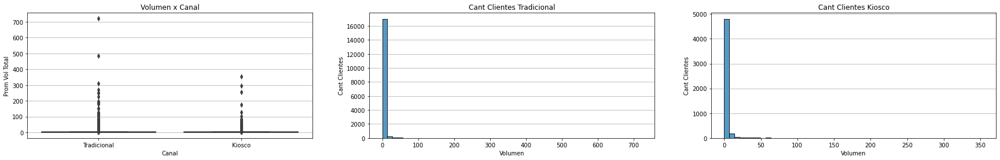

In [99]:
fig, axs = plt.subplots(1,3, figsize=(30,4))
axs[0].set(xlabel = "Canal", ylabel = "Volumen", title = "Volumen x Canal")
sns.boxplot(ax=axs[0],data=data, x='Canal',y='Prom Vol Total')
axs[0].grid(axis='y', color='gray', linewidth=0.5)
axs[1].grid(axis='y', color='gray', linewidth=0.5)
axs[2].grid(axis='y', color='gray', linewidth=0.5)

axs[1].set(xlabel = "Volumen", ylabel = "Cant Clientes", title = "Cant Clientes Tradicional")
sns.histplot(ax=axs[1],data=data[data['Canal']=='Tradicional' ] , x='Prom Vol Total',bins=50)
axs[2].set(xlabel = "Volumen", ylabel = "Cant Clientes", title = "Cant Clientes Kiosco")
sns.histplot(ax=axs[2],data=data[data['Canal']=='Kiosco' ] , x='Prom Vol Total',bins=50)
;

#### Si analizo un poco la distribución de los clientes K+T, a simple vista veo una minoria de clientes que distorsionan bastante la muestra por su gran volumen de venta. 
#### Llego a tener clientes con más de 700HL de venta (más de 5.800 cajones mensuales)... 
#### Estos son casos de K+T que no solo venden al consumidor final, sino que tambieén venden a otros clientes minoristas. 
#### Identifico a estos clientes outlier de cada ciudad y serán un 1er Cluster dentro del K+T que genere manualmente. Lo identifique como Clientes Simil-Mayoristas.   

In [100]:
Q1 = data.groupby(['Canal','Ciudad']).quantile(0.25)[['Prom Vol Total']]
Q3 = data.groupby(['Canal','Ciudad']).quantile(0.75)[['Prom Vol Total']]
RIC = Q3 - Q1
outlier = Q3 + (1.5 * RIC)
data = data.merge(outlier.reset_index().rename(columns={'Prom Vol Total':'outlier'}),how='left',on=['Canal','Ciudad'])
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Prom Fact Ind,Mix Vol Above Core,Mix Fact Above Core,Prom SKU,Prom SKU Prem,Prom SKU Core Plus,Prom SKU Core,Prom SKU Value,Mix SKU Above Core,outlier
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,179275.12,0.672426,0.754860,43.67,18.17,12.50,12.50,1.5,0.702290,6.5650
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,230828.76,0.673486,0.731793,43.00,17.67,11.00,14.00,1.0,0.666667,12.1975
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,212882.40,0.704017,0.775565,42.67,21.17,9.67,11.83,0.0,0.722656,12.1975
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,197996.65,0.617456,0.677387,41.50,17.50,10.83,13.17,0.0,0.682731,6.5650
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,78900.56,0.612283,0.690199,41.33,16.00,12.50,12.33,1.0,0.689516,4.5750


In [101]:
es_outlier = data.apply(lambda x: 1 if x['Prom Vol Total'] >= x.outlier else 0, axis = 1)
data['es_outlier'] = es_outlier
data.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Mix Vol Above Core,Mix Fact Above Core,Prom SKU,Prom SKU Prem,Prom SKU Core Plus,Prom SKU Core,Prom SKU Value,Mix SKU Above Core,outlier,es_outlier
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,0.672426,0.754860,43.67,18.17,12.50,12.50,1.5,0.702290,6.5650,1
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,0.673486,0.731793,43.00,17.67,11.00,14.00,1.0,0.666667,12.1975,1
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,0.704017,0.775565,42.67,21.17,9.67,11.83,0.0,0.722656,12.1975,1
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,0.617456,0.677387,41.50,17.50,10.83,13.17,0.0,0.682731,6.5650,1
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,0.612283,0.690199,41.33,16.00,12.50,12.33,1.0,0.689516,4.5750,1


In [102]:
data.es_outlier.value_counts()

0    20324
1     2205
Name: es_outlier, dtype: int64

''

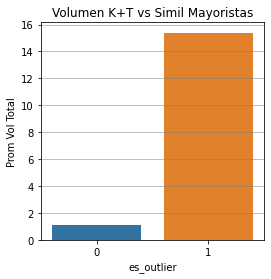

In [103]:
tablaoutlier= data.groupby(by=['es_outlier'])[['Prom Vol Total']].mean().reset_index()

fig, axs = plt.subplots(figsize=(4,4))
axs.set(ylabel = "Volumen", title = "Volumen K+T vs Simil Mayoristas")
axs.grid(axis='y', color='gray', linewidth=0.5)
sns.barplot(ax=axs, data= tablaoutlier, x='es_outlier',y='Prom Vol Total')
;

''

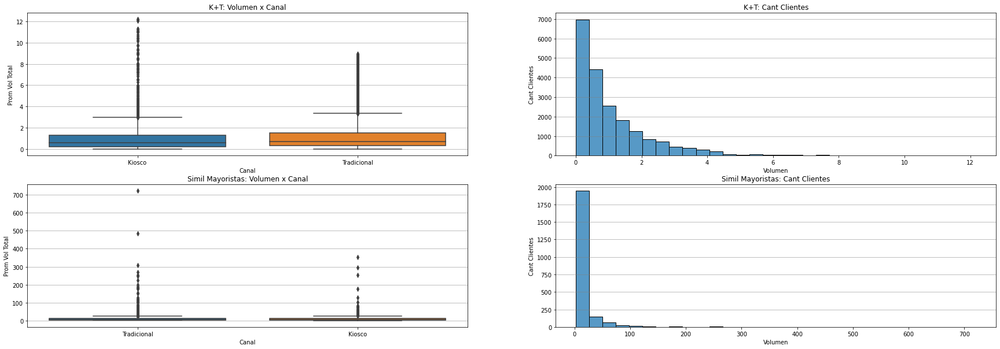

In [104]:
fig, axs = plt.subplots(2,2, figsize=(30,10))
axs[0,0].grid(axis='y', color='gray', linewidth=0.5)
axs[1,0].grid(axis='y', color='gray', linewidth=0.5)
axs[0,1].grid(axis='y', color='gray', linewidth=0.5)
axs[1,1].grid(axis='y', color='gray', linewidth=0.5)
axs[0,0].set(xlabel = "Canal", ylabel = "Volumen", title = "K+T: Volumen x Canal")
sns.boxplot(ax=axs[0,0],data=data[data['es_outlier']==0] , x='Canal',y='Prom Vol Total')
axs[1,0].set(xlabel = "Canal", ylabel = "Volumen", title = "Simil Mayoristas: Volumen x Canal")
sns.boxplot(ax=axs[1,0],data=data[data['es_outlier']==1] , x='Canal',y='Prom Vol Total')

axs[0,1].set(xlabel = "Volumen", ylabel = "Cant Clientes", title = "K+T: Cant Clientes")
sns.histplot(ax=axs[0,1],data=data[data['es_outlier']==0 ] , x='Prom Vol Total',bins=30)
axs[1,1].set(xlabel = "Volumen", ylabel = "Cant Clientes", title = "Simil Mayoristas: Cant Clientes")
sns.histplot(ax=axs[1,1],data=data[data['es_outlier']==1 ] , x='Prom Vol Total',bins=30)
;

#### Acá puedo evidenciar la dispariedad de volumen que tengo entre estos los clientes simil-mayoristas y el resto del K+T  
#### Analizare con más detalle este 1er Cluster.

In [105]:
Simil_Mayoristas = data[data['es_outlier']==1]
Simil_Mayoristas.describe()

,Cliente ID,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,Prom Vol Prem,Prom Fact Prem,Prom Vol Core Plus,Prom Fact Core Plus,Prom Vol Core,...,Mix Vol Above Core,Mix Fact Above Core,Prom SKU,Prom SKU Prem,Prom SKU Core Plus,Prom SKU Core,Prom SKU Value,Mix SKU Above Core,outlier,es_outlier
count,2205.000000,2205.000000,2205.000000,2205.000000,2.205000e+03,2205.000000,2.205000e+03,2205.000000,2.205000e+03,2205.000000,...,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.0
mean,412719.067120,67.638549,5.478458,15.387016,2.004732e+05,2.150000,4.506030e+04,2.579147,3.691672e+04,11.152327,...,0.293033,0.358601,12.225179,4.425773,3.625442,4.705002,0.222930,0.521234,4.641382,1.0
std,131240.102264,72.109896,1.188310,30.437802,3.813619e+05,6.208887,1.317604e+05,5.678028,7.656831e+04,24.483107,...,0.238735,0.262630,7.790716,3.520190,2.570541,2.271265,0.458539,0.221152,1.781971,0.0
min,525.000000,1.000000,1.000000,2.450000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.200000,1.0
25%,376704.000000,20.000000,6.000000,5.150000,6.909098e+04,0.400000,7.726780e+03,0.300000,4.874850e+03,3.250000,...,0.086191,0.126357,6.170000,2.000000,1.750000,3.000000,0.000000,0.428571,3.865000,1.0
50%,417870.000000,45.000000,6.000000,7.630000,1.033411e+05,0.880000,1.755000e+04,1.110000,1.700392e+04,5.200000,...,0.250641,0.338794,10.500000,3.330000,3.000000,4.500000,0.000000,0.568966,4.293750,1.0
75%,437019.000000,93.000000,6.000000,13.970000,1.911792e+05,1.840000,3.815055e+04,2.560000,3.846915e+04,9.610000,...,0.454418,0.555913,16.830000,6.000000,5.170000,6.000000,0.000000,0.675127,4.645000,1.0
max,899358.000000,499.000000,6.000000,721.150000,8.713774e+06,156.960000,2.428685e+06,78.150000,1.043380e+06,522.960000,...,1.000000,1.000000,43.670000,21.170000,12.830000,14.000000,3.000000,1.000000,12.197500,1.0


In [106]:
Simil_Mayoristas.head()

,Cliente ID,Canal,Ciudad,Localidad,Perfil Impositivo,Fecha de Alta,Antiguedad,Meses c/ Compra,Prom Vol Total,Prom Fact Total,...,Mix Vol Above Core,Mix Fact Above Core,Prom SKU,Prom SKU Prem,Prom SKU Core Plus,Prom SKU Core,Prom SKU Value,Mix SKU Above Core,outlier,es_outlier
0,410375,Tradicional,Ciudad 8,Localidad 2,Inscripto,2017-12-15,44.0,6,22.33,311283.53,...,0.672426,0.754860,43.67,18.17,12.50,12.50,1.5,0.702290,6.5650,1
1,428859,Kiosco,Ciudad 8,Localidad 2,Inscripto,2019-07-31,24.0,6,20.64,289379.61,...,0.673486,0.731793,43.00,17.67,11.00,14.00,1.0,0.666667,12.1975,1
2,415342,Kiosco,Ciudad 8,Localidad 2,Inscripto,2018-05-28,38.0,6,18.25,285379.43,...,0.704017,0.775565,42.67,21.17,9.67,11.83,0.0,0.722656,12.1975,1
3,364696,Tradicional,Ciudad 8,Localidad 2,Inscripto,2013-12-30,91.0,6,21.98,280511.35,...,0.617456,0.677387,41.50,17.50,10.83,13.17,0.0,0.682731,6.5650,1
4,435368,Tradicional,Ciudad 2,Localidad 6,Inscripto,2020-03-03,17.0,6,15.87,234863.58,...,0.612283,0.690199,41.33,16.00,12.50,12.33,1.0,0.689516,4.5750,1


In [107]:
tablasimilmayo= pd.DataFrame(Simil_Mayoristas.mean())
tablasimilmayo

<ipython-input-107-c9edfcf50e4c>:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  tablasimilmayo= pd.DataFrame(Simil_Mayoristas.mean())


,0
Cliente ID,412719.067120
Antiguedad,67.638549
Meses c/ Compra,5.478458
Prom Vol Total,15.387016
Prom Fact Total,200473.225583
Prom Vol Prem,2.150000
Prom Fact Prem,45060.304376
Prom Vol Core Plus,2.579147
Prom Fact Core Plus,36916.724005
Prom Vol Core,11.152327


In [108]:
tablasimilmayociudad = Simil_Mayoristas.groupby(by='Ciudad').agg(['count','sum'])
tablasimilmayociudad = tablasimilmayociudad['Prom Vol Total'].reset_index()
tablasimilmayociudad

,Ciudad,count,sum
0,Ciudad 1,85,3620.88
1,Ciudad 2,363,5708.72
2,Ciudad 3,352,4516.25
3,Ciudad 4,593,8762.49
4,Ciudad 5,225,2852.76
5,Ciudad 6,300,2584.88
6,Ciudad 7,160,2751.57
7,Ciudad 8,127,3130.82


<ipython-input-109-c5324bcbbe89>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0,0].set_xticklabels(axs[0,0].get_xticklabels(), rotation=15, ha="right")
<ipython-input-109-c5324bcbbe89>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0,1].set_xticklabels(axs[0,1].get_xticklabels(), rotation=15, ha="right")
<ipython-input-109-c5324bcbbe89>:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0,2].set_xticklabels(axs[0,2].get_xticklabels(), rotation=15, ha="right")
<ipython-input-109-c5324bcbbe89>:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0,3].set_xticklabels(axs[0,3].get_xticklabels(), rotation=15, ha="right")
<ipython-input-109-c5324bcbbe89>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1,2].set_xticklabels(axs[1,2].get_xticklabels(), rotation=30, ha="right")
<ipython-input-109-c5324bcbbe89>:15: Use

''

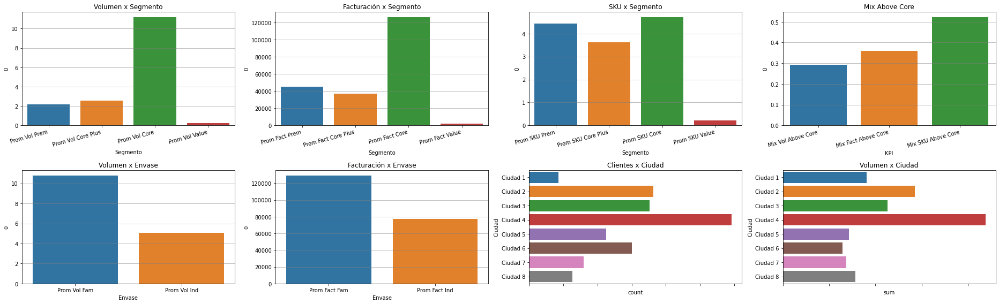

In [109]:
fig, axs = plt.subplots(2,4,figsize=(26,8))
axs[0,0].set(xlabel = "Segmento", ylabel = "Volumen", title = "Volumen x Segmento")
axs[0,1].set(xlabel = "Segmento", ylabel = "Facturación", title = "Facturación x Segmento")
axs[0,2].set(xlabel = "Segmento", ylabel = "SKU", title = "SKU x Segmento")
axs[0,3].set(xlabel = "KPI", ylabel = "Porcentaje", title = "Mix Above Core")
axs[1,0].set(xlabel = "Envase", ylabel = "Volumen", title = "Volumen x Envase")
axs[1,1].set(xlabel = "Envase", ylabel = "Facturación", title = "Facturación x Envase")
axs[1,2].set(xlabel = "Ciudad", ylabel = "Cant Clientes", title = "Clientes x Ciudad")
axs[1,3].set(xlabel = "Ciudad", ylabel = "Volumen", title = "Volumen x Ciudad")
axs[0,0].set_xticklabels(axs[0,0].get_xticklabels(), rotation=15, ha="right")
axs[0,1].set_xticklabels(axs[0,1].get_xticklabels(), rotation=15, ha="right")
axs[0,2].set_xticklabels(axs[0,2].get_xticklabels(), rotation=15, ha="right")
axs[0,3].set_xticklabels(axs[0,3].get_xticklabels(), rotation=15, ha="right")
axs[1,2].set_xticklabels(axs[1,2].get_xticklabels(), rotation=30, ha="right")
axs[1,3].set_xticklabels(axs[1,3].get_xticklabels(), rotation=30, ha="right")
axs[0,0].grid(axis='y', color='gray', linewidth=0.5)
axs[0,1].grid(axis='y', color='gray', linewidth=0.5)
axs[0,2].grid(axis='y', color='gray', linewidth=0.5)
axs[0,3].grid(axis='y', color='gray', linewidth=0.5)
axs[1,0].grid(axis='y', color='gray', linewidth=0.5)
axs[1,1].grid(axis='y', color='gray', linewidth=0.5)
axs[1,2].grid(axis='y', color='gray', linewidth=0.5)
axs[1,3].grid(axis='y', color='gray', linewidth=0.5)

sns.barplot(ax=axs[0,0], data= tablasimilmayo.loc[['Prom Vol Prem','Prom Vol Core Plus','Prom Vol Core','Prom Vol Value']] ,y=0,x=['Prom Vol Prem','Prom Vol Core Plus','Prom Vol Core','Prom Vol Value'])
sns.barplot(ax=axs[0,1], data= tablasimilmayo.loc[['Prom Fact Prem','Prom Fact Core Plus','Prom Fact Core','Prom Fact Value']] ,y=0,x=['Prom Fact Prem','Prom Fact Core Plus','Prom Fact Core','Prom Fact Value'])
sns.barplot(ax=axs[0,2], data= tablasimilmayo.loc[['Prom SKU Prem','Prom SKU Core Plus','Prom SKU Core','Prom SKU Value']] ,y=0,x=['Prom SKU Prem','Prom SKU Core Plus','Prom SKU Core','Prom SKU Value'])
sns.barplot(ax=axs[0,3], data= tablasimilmayo.loc[['Mix Vol Above Core','Mix Fact Above Core','Mix SKU Above Core']] ,y=0,x=['Mix Vol Above Core','Mix Fact Above Core','Mix SKU Above Core'])
sns.barplot(ax=axs[1,0], data= tablasimilmayo.loc[['Prom Vol Fam','Prom Vol Ind']] ,y=0,x=['Prom Vol Fam','Prom Vol Ind'])
sns.barplot(ax=axs[1,1], data= tablasimilmayo.loc[['Prom Fact Fam','Prom Fact Ind']] ,y=0,x=['Prom Fact Fam','Prom Fact Ind'])
sns.barplot(ax=axs[1,2], data= tablasimilmayociudad,x='count',y='Ciudad',orient='h')
sns.barplot(ax=axs[1,3], data= tablasimilmayociudad,x='sum',y='Ciudad',orient='h')
plt.tight_layout()
;

#### Se puede ver como estos clientes tienen un Mix SKUs Above Core casi del doble que el Mix de Vol. Lo cual se debe a que son clientes que trabajan una gran cantidad de productos, pero, generan un gran volumen con las marcas Core.
#### Tambien veo que estos en la ciudad 1 tienen pocos clientes simil Mayoristas, pero de mucho volumen. 
#### queda el resto del K+T

In [110]:
data = data[data.es_outlier == 0]
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20324 entries, 6 to 22528
Data columns (total 32 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Cliente ID           20324 non-null  int64         
 1   Canal                20324 non-null  object        
 2   Ciudad               20324 non-null  object        
 3   Localidad            20324 non-null  object        
 4   Perfil Impositivo    20324 non-null  object        
 5   Fecha de Alta        20324 non-null  datetime64[ns]
 6   Antiguedad           20324 non-null  float64       
 7   Meses c/ Compra      20324 non-null  int64         
 8   Prom Vol Total       20324 non-null  float64       
 9   Prom Fact Total      20324 non-null  float64       
 10  Prom Vol Prem        20324 non-null  float64       
 11  Prom Fact Prem       20324 non-null  float64       
 12  Prom Vol Core Plus   20324 non-null  float64       
 13  Prom Fact Core Plus  20324 non-

In [111]:
tablakt= pd.DataFrame(data.mean())
tablakt

<ipython-input-111-53adc3abbf57>:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  tablakt= pd.DataFrame(data.mean())


,0
Cliente ID,406386.495769
Antiguedad,82.875271
Meses c/ Compra,4.508906
Prom Vol Total,1.109170
Prom Fact Total,15792.302357
Prom Vol Prem,0.196414
Prom Fact Prem,4381.258183
Prom Vol Core Plus,0.240513
Prom Fact Core Plus,3764.555989
Prom Vol Core,0.764438


In [112]:
tablaktciudad = data.groupby(by='Ciudad').agg(['count','sum'])
tablaktciudad = tablaktciudad['Prom Vol Total'].reset_index()
tablaktciudad

,Ciudad,count,sum
0,Ciudad 1,740,1085.99
1,Ciudad 2,3392,3619.89
2,Ciudad 3,3164,2563.73
3,Ciudad 4,4734,4623.59
4,Ciudad 5,2245,2362.13
5,Ciudad 6,3305,2413.51
6,Ciudad 7,1667,3811.16
7,Ciudad 8,1077,2062.77


In [113]:
tablaperfil = data.groupby(by='Perfil Impositivo')['Prom Vol Total'].agg(['count','mean'])
tablaperfil = tablaperfil.reset_index()
tablaperfil

,Perfil Impositivo,count,mean
0,Inscripto,14768,1.171022
1,No inscripto,5556,0.944764


<ipython-input-114-4e236fe8ed1f>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0,0].set_xticklabels(axs[0,0].get_xticklabels(), rotation=15, ha="right")
<ipython-input-114-4e236fe8ed1f>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0,1].set_xticklabels(axs[0,1].get_xticklabels(), rotation=15, ha="right")
<ipython-input-114-4e236fe8ed1f>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0,2].set_xticklabels(axs[0,2].get_xticklabels(), rotation=15, ha="right")
<ipython-input-114-4e236fe8ed1f>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0,3].set_xticklabels(axs[0,3].get_xticklabels(), rotation=15, ha="right")
<ipython-input-114-4e236fe8ed1f>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1,2].set_xticklabels(axs[1,2].get_xticklabels(), rotation=30, ha="right")
<ipython-input-114-4e236fe8ed1f>:19: Use

''

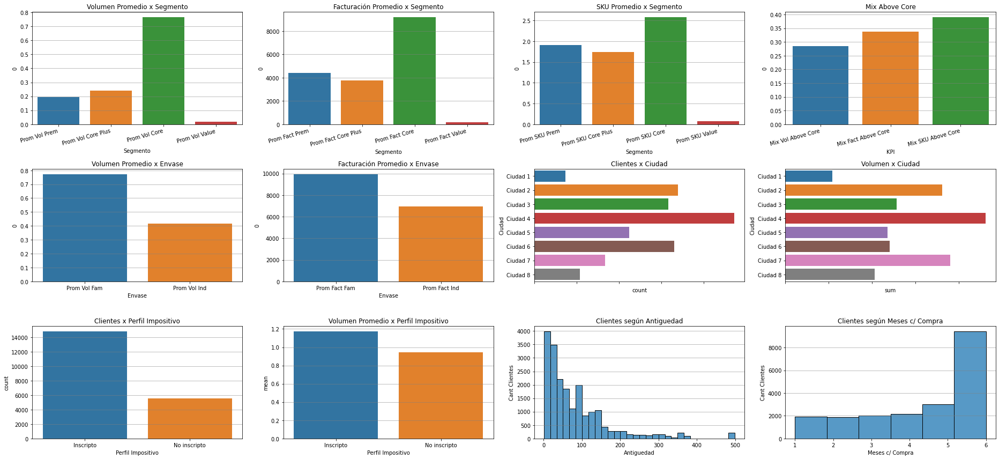

In [114]:
fig, axs = plt.subplots(3,4,figsize=(26,12))
axs[0,0].set(xlabel = "Segmento", ylabel = "Volumen", title = "Volumen Promedio x Segmento")
axs[0,1].set(xlabel = "Segmento", ylabel = "Facturación", title = "Facturación Promedio x Segmento")
axs[0,2].set(xlabel = "Segmento", ylabel = "SKU", title = "SKU Promedio x Segmento")
axs[0,3].set(xlabel = "KPI", ylabel = "Porcentaje", title = "Mix Above Core")
axs[1,0].set(xlabel = "Envase", ylabel = "Volumen", title = "Volumen Promedio x Envase")
axs[1,1].set(xlabel = "Envase", ylabel = "Facturación", title = "Facturación Promedio x Envase")
axs[1,2].set(xlabel = "Ciudad", ylabel = "Cant Clientes", title = "Clientes x Ciudad")
axs[1,3].set(xlabel = "Ciudad", ylabel = "Volumen", title = "Volumen x Ciudad")
axs[2,0].set(xlabel = "Perfil Impositivo", ylabel = "Cant Clientes", title = "Clientes x Perfil Impositivo")
axs[2,1].set(xlabel = "Perfil Impositivo", ylabel = "Volumen", title = "Volumen Promedio x Perfil Impositivo")
axs[2,2].set(xlabel = "Antiguedad", ylabel = "Cant Clientes", title = "Clientes según Antiguedad")
axs[2,3].set(xlabel = "Meses c/ Compra", ylabel = "Cant Clientes", title = "Clientes según Meses c/ Compra")
axs[0,0].set_xticklabels(axs[0,0].get_xticklabels(), rotation=15, ha="right")
axs[0,1].set_xticklabels(axs[0,1].get_xticklabels(), rotation=15, ha="right")
axs[0,2].set_xticklabels(axs[0,2].get_xticklabels(), rotation=15, ha="right")
axs[0,3].set_xticklabels(axs[0,3].get_xticklabels(), rotation=15, ha="right")
axs[1,2].set_xticklabels(axs[1,2].get_xticklabels(), rotation=30, ha="right")
axs[1,3].set_xticklabels(axs[1,3].get_xticklabels(), rotation=30, ha="right")
axs[0,0].grid(axis='y', color='gray', linewidth=0.5)
axs[0,1].grid(axis='y', color='gray', linewidth=0.5)
axs[0,2].grid(axis='y', color='gray', linewidth=0.5)
axs[0,3].grid(axis='y', color='gray', linewidth=0.5)
axs[1,0].grid(axis='y', color='gray', linewidth=0.5)
axs[1,1].grid(axis='y', color='gray', linewidth=0.5)
axs[1,2].grid(axis='y', color='gray', linewidth=0.5)
axs[1,3].grid(axis='y', color='gray', linewidth=0.5)
axs[2,0].grid(axis='y', color='gray', linewidth=0.5)
axs[2,1].grid(axis='y', color='gray', linewidth=0.5)
axs[2,2].grid(axis='y', color='gray', linewidth=0.5)
axs[2,3].grid(axis='y', color='gray', linewidth=0.5)

sns.barplot(ax=axs[0,0], data= tablakt.loc[['Prom Vol Prem','Prom Vol Core Plus','Prom Vol Core','Prom Vol Value']] ,y=0,x=['Prom Vol Prem','Prom Vol Core Plus','Prom Vol Core','Prom Vol Value'])
sns.barplot(ax=axs[0,1], data= tablakt.loc[['Prom Fact Prem','Prom Fact Core Plus','Prom Fact Core','Prom Fact Value']] ,y=0,x=['Prom Fact Prem','Prom Fact Core Plus','Prom Fact Core','Prom Fact Value'])
sns.barplot(ax=axs[0,2], data= tablakt.loc[['Prom SKU Prem','Prom SKU Core Plus','Prom SKU Core','Prom SKU Value']] ,y=0,x=['Prom SKU Prem','Prom SKU Core Plus','Prom SKU Core','Prom SKU Value'])
sns.barplot(ax=axs[0,3], data= tablakt.loc[['Mix Vol Above Core','Mix Fact Above Core','Mix SKU Above Core']] ,y=0,x=['Mix Vol Above Core','Mix Fact Above Core','Mix SKU Above Core'])
sns.barplot(ax=axs[1,0], data= tablakt.loc[['Prom Vol Fam','Prom Vol Ind']] ,y=0,x=['Prom Vol Fam','Prom Vol Ind'])
sns.barplot(ax=axs[1,1], data= tablakt.loc[['Prom Fact Fam','Prom Fact Ind']] ,y=0,x=['Prom Fact Fam','Prom Fact Ind'])
sns.barplot(ax=axs[1,2], data= tablaktciudad,x='count',y='Ciudad',orient='h')
sns.barplot(ax=axs[1,3], data= tablaktciudad,x='sum',y='Ciudad',orient='h')
sns.barplot(ax=axs[2,0], data= tablaperfil,y='count',x='Perfil Impositivo')
sns.barplot(ax=axs[2,1], data= tablaperfil,y='mean',x='Perfil Impositivo')
sns.histplot(ax=axs[2,2], data= data,x='Antiguedad',bins=30)
sns.histplot(ax=axs[2,3], data= data,x='Meses c/ Compra',bins=6)
plt.tight_layout()
;

#### A diferencia del grupo de simil-mayoristas, los mix de Vol y SKUs son más parejos. 

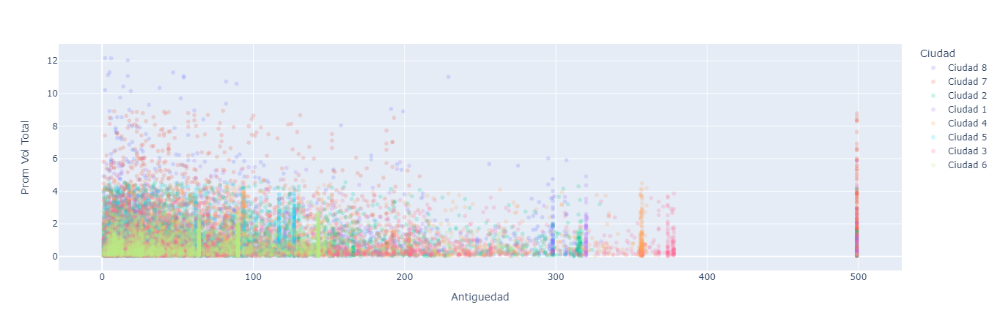

In [115]:
px.scatter(data, y='Prom Vol Total',x='Antiguedad',color='Ciudad',opacity=0.2,)

#### Llama la atención ver que varios clientes dados de alta en el año 1980, pero luego hay un hueco de 120 años sin altas registradas... Pareciera haber un error en la información.
#### Por el momento lo omitio y luego decidire que acción tomar, depende el impacto que tenga. 

In [116]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20324 entries, 6 to 22528
Data columns (total 32 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Cliente ID           20324 non-null  int64         
 1   Canal                20324 non-null  object        
 2   Ciudad               20324 non-null  object        
 3   Localidad            20324 non-null  object        
 4   Perfil Impositivo    20324 non-null  object        
 5   Fecha de Alta        20324 non-null  datetime64[ns]
 6   Antiguedad           20324 non-null  float64       
 7   Meses c/ Compra      20324 non-null  int64         
 8   Prom Vol Total       20324 non-null  float64       
 9   Prom Fact Total      20324 non-null  float64       
 10  Prom Vol Prem        20324 non-null  float64       
 11  Prom Fact Prem       20324 non-null  float64       
 12  Prom Vol Core Plus   20324 non-null  float64       
 13  Prom Fact Core Plus  20324 non-

#### Genero las dummies de las variables categoricas

In [117]:
dummies_canal=pd.get_dummies(data.Canal, drop_first=True)
data=pd.concat([data,dummies_canal], axis=1)

In [118]:
dummies_ciudad=pd.get_dummies(data.Ciudad, drop_first=True)
data=pd.concat([data,dummies_ciudad], axis=1)

In [119]:
dummies_perfil=pd.get_dummies(data['Perfil Impositivo'], drop_first=True)
data=pd.concat([data,dummies_perfil], axis=1)

In [120]:
dataset = data.drop(columns=['Canal','Ciudad','Perfil Impositivo','Localidad','Fecha de Alta','outlier','es_outlier'])
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20324 entries, 6 to 22528
Data columns (total 34 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Cliente ID           20324 non-null  int64  
 1   Antiguedad           20324 non-null  float64
 2   Meses c/ Compra      20324 non-null  int64  
 3   Prom Vol Total       20324 non-null  float64
 4   Prom Fact Total      20324 non-null  float64
 5   Prom Vol Prem        20324 non-null  float64
 6   Prom Fact Prem       20324 non-null  float64
 7   Prom Vol Core Plus   20324 non-null  float64
 8   Prom Fact Core Plus  20324 non-null  float64
 9   Prom Vol Core        20324 non-null  float64
 10  Prom Fact Core       20324 non-null  float64
 11  Prom Vol Value       20324 non-null  float64
 12  Prom Fact Value      20324 non-null  float64
 13  Prom Vol Fam         20324 non-null  float64
 14  Prom Fact Fam        20324 non-null  float64
 15  Prom Vol Ind         20324 non-null 

#### Ahora veo las correlaciones entre estas.

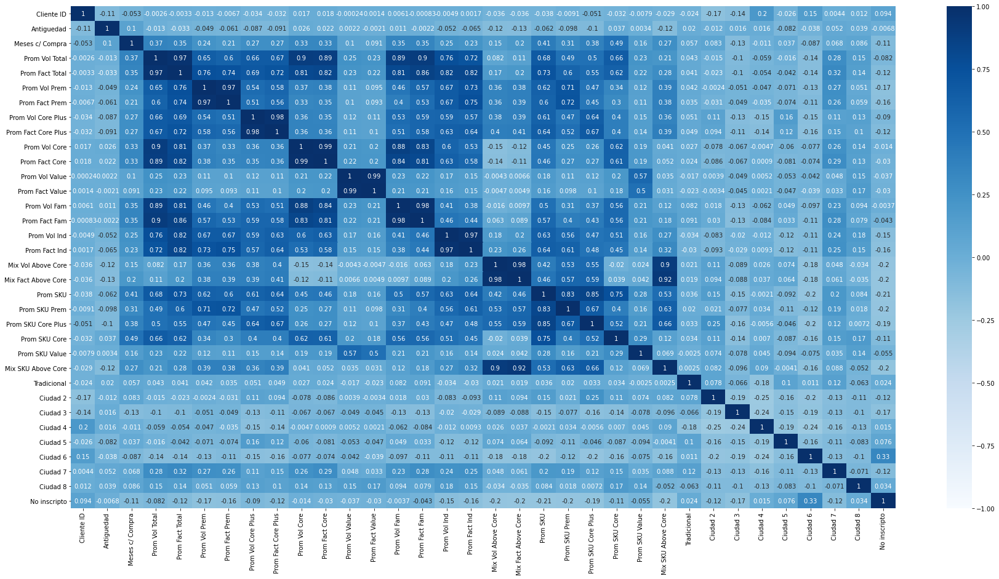

In [121]:
plt.figure(figsize=(30,15))
sns.heatmap(dataset.corr(), annot=True, vmin=-1, cmap='Blues');

#### Como era de suponer tengo fuertes correlaciones entre las variables de Volumen, Facturación y SKUs.
#### Tendre que tener esto presente.
#### 
#### Ahora busco el mejor modelo para definir los clusters:
#### Lo primero que hago sera correr un modelo con solo con Vol Total y Mix Above Core. El imput de Negocio es que estos 2 KPIs son claves para segmentar los clientes. 
#### Luego voy complejizando los modelos hasta escoger el que mejor se ajuste a la necesidad del negocio.
#### 
#### se usa Kmeans y hay que escalar los datos.

In [122]:
#X = dataset.drop(dataset.columns[0], axis=1)
X = dataset[['Prom Vol Total','Mix Vol Above Core']]

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)

#### Defino una función para evaluar la cantidad de clusters y los evaluo segun los scores de inercia, silhouette y Calinski-Harabasz<


In [123]:
def Search_Kmeans(X_scaled):
    k_values=range(2,20)
    sq_distances=[] 
    sil=[]
    ch_scores=[]
    for k in k_values:
        kmeans=KMeans(n_clusters=k,n_init=10,random_state=0)
        kmeans.fit(X_scaled)
        sq_distances.append(kmeans.inertia_)
        score=silhouette_score(X_scaled,kmeans.labels_)
        sil.append(score)
        score=calinski_harabasz_score(X_scaled,kmeans.labels_)
        ch_scores.append(score)

    fig, axs = plt.subplots(1,3,figsize=(20,5))
    axs[0].set(xlabel = "Número de clusters", ylabel = "Suma Distancias Cuadráticas", title = "Inercia Score")
    axs[1].set(xlabel = "Número de clusters", ylabel = "Silhouette score", title = "Silhouette Score")
    axs[2].set(xlabel = "Número de clusters", ylabel = "Calinski-Harabasz Score", title = "Calinski-Harabasz Score")
    sns.lineplot(ax=axs[0],x=k_values,y=sq_distances,marker='o',size=30,legend=False )
    sns.lineplot(ax=axs[1],x=k_values,y=sil,marker='o',size=30,legend=False )
    sns.lineplot(ax=axs[2],x=k_values,y=ch_scores,marker='o',size=30,legend=False )
    axs[0].grid(color='gray', linewidth=1, ls='--')
    axs[1].grid(color='gray', linewidth=1, ls='--')
    axs[2].grid(color='gray', linewidth=1, ls='--')
;

''

#### Se evaluan los 3 indicadores definidos en base al set de features

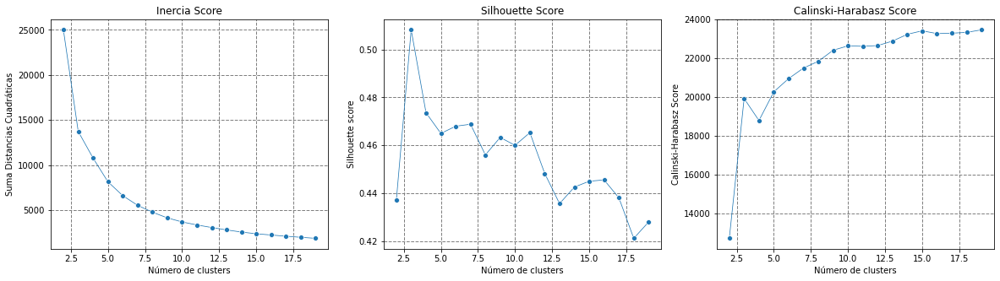

In [124]:
Search_Kmeans(X_scaled)

#### Con la información de los gráficos previos,hay que analizar con más detalle los clusters entre 2 y 7. Para cada número de clusters hago el gráfico de velas de Silhouette Score y los clusters resultantes en función a las variables Prom Vol Total y prom Mix Above Core.

For n_clusters = 2 The average silhouette_score is : 0.43708327538868624
For n_clusters = 3 The average silhouette_score is : 0.5082674286507985
For n_clusters = 4 The average silhouette_score is : 0.47267274543880117
For n_clusters = 5 The average silhouette_score is : 0.46498916693354836
For n_clusters = 6 The average silhouette_score is : 0.46808647351951516
For n_clusters = 7 The average silhouette_score is : 0.4716063282185233


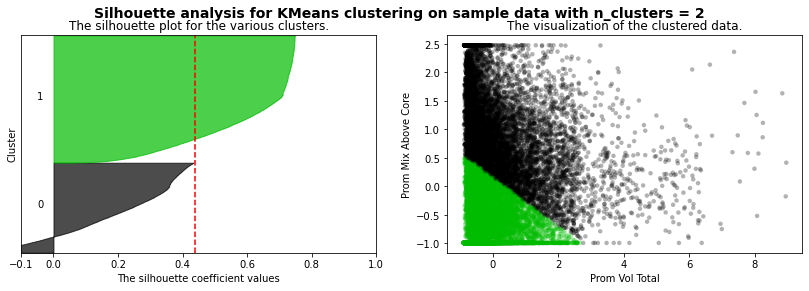

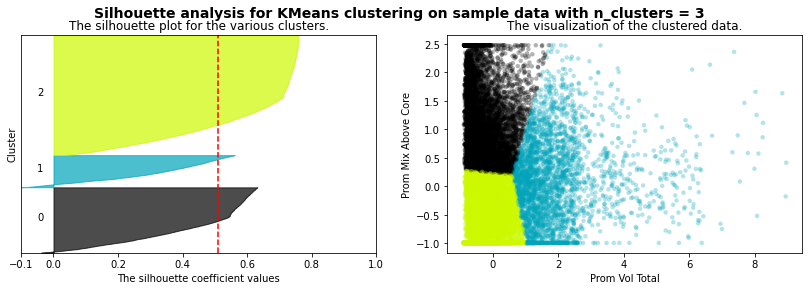

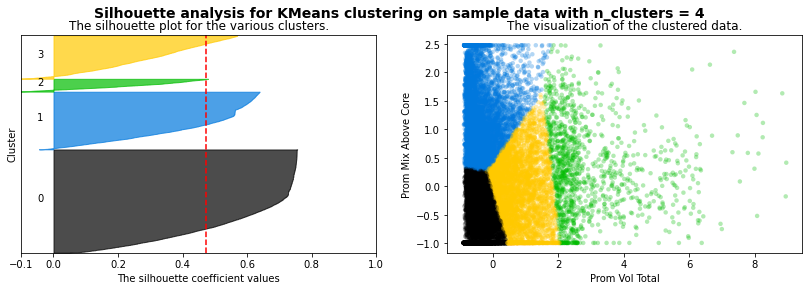

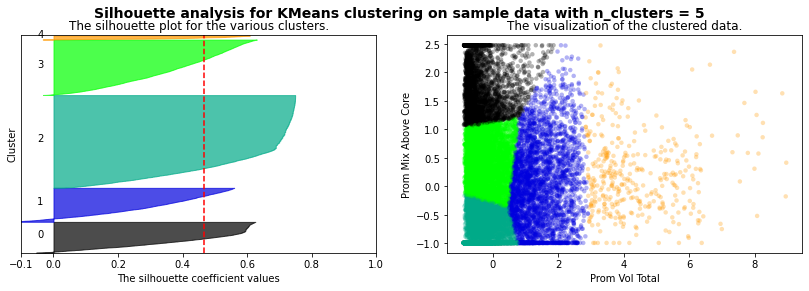

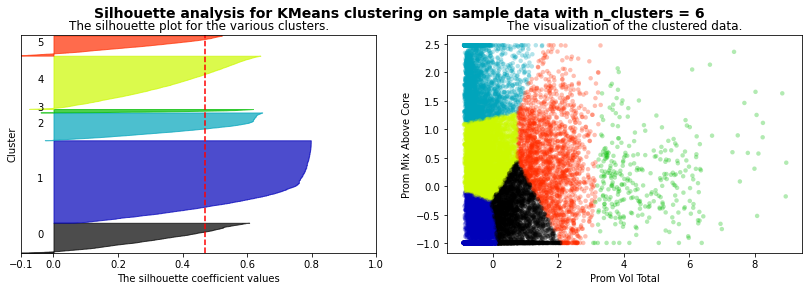

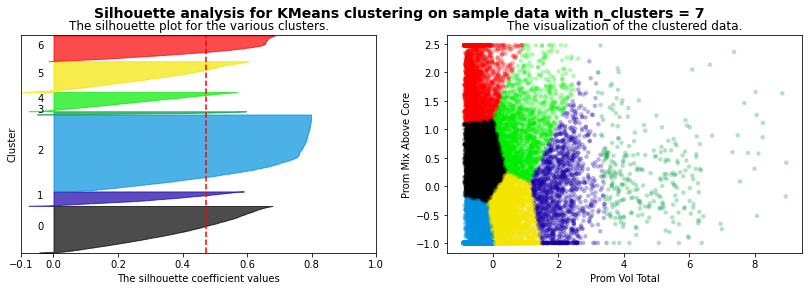

In [125]:
for n_clusters in range(2,8):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(14,4)
    
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_scaled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_scaled[:, 0], X_scaled[:, 1], marker='.', s=80, lw=0, alpha=0.3,
                c=colors, edgecolor='k')
    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Prom Vol Total")
    ax2.set_ylabel("Prom Mix Above Core")
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % n_clusters),fontsize=14, fontweight='bold')

#### Se concluye que los valores de 3 y 5 clusters son los más convenientes

#### Ahora defino funciones para analizar la composición de los clusters.

In [126]:
def Kmeans(X_scaled,k):
    kmeans = KMeans(n_clusters=k,n_init=10,random_state=0)
    kmeans.fit(X_scaled)
    
    labels = kmeans.labels_ 
    
    frames = [data.reset_index(drop=True) ,pd.DataFrame(labels, columns=['Cluster'])]
    result = pd.concat(frames, axis=1)
    clusters = result
    
    fig, axs = plt.subplots(1,3,figsize=(16,5))
    axs[0].set(xlabel = "Mix Above Core", ylabel = "Prom Vol Total", title = "Volumen & Mix x Cluster")
    axs[2].set(xlabel = "Prom Vol Ind", ylabel = "Prom Vol Total", title = "Volumen & Vol Ind x Cluster")
    axs[1].set(xlabel = "Prom SKU", ylabel = "Prom Vol Total", title = "Volumen & SKU x Cluster")
    sns.scatterplot(ax=axs[0],x=clusters['Mix Vol Above Core'],y=clusters['Prom Vol Total'],hue=labels,legend='full',palette=sns.color_palette("hls", k),alpha=0.4)
    sns.scatterplot(ax=axs[1],x=clusters['Prom SKU'],y=clusters['Prom Vol Total'],hue=labels,legend='full',palette=sns.color_palette("hls", k),alpha=0.4)
    sns.scatterplot(ax=axs[2],x=clusters['Prom Vol Ind'],y=clusters['Prom Vol Total'],hue=labels,legend='full',palette=sns.color_palette("hls", k),alpha=0.4)
    plt.tight_layout()
    
    
    g = sns.FacetGrid(clusters, col="Ciudad",hue='Cluster',palette=sns.color_palette("hls", k),col_order=['Ciudad 1','Ciudad 2','Ciudad 3','Ciudad 4','Ciudad 5','Ciudad 6','Ciudad 7','Ciudad 8'])
    g.map(sns.countplot,'Cluster',order=range(0,k))
    ;

In [127]:
def Kmeans2(X_scaled,k):
    kmeans = KMeans(n_clusters=k,n_init=10,random_state=0)
    kmeans.fit(X_scaled)
    
    labels = kmeans.labels_ 
    
    frames = [data.reset_index(drop=True) ,pd.DataFrame(labels, columns=['Cluster'])]
    result = pd.concat(frames, axis=1)
    clusters = result
    
    fig,ax=plt.subplots(2,5,figsize=(16,8))
    row=0
    col=0
    for i in ['Antiguedad','Meses c/ Compra','Prom Vol Total','Prom Fact Total','Prom Vol Fam', 'Prom Vol Ind','Mix Vol Above Core','Prom SKU','Mix SKU Above Core']:
        sns.boxplot(x=clusters['Cluster'],y=clusters[i],ax=ax[row,col], palette=sns.color_palette("hls", k))
        col+=1
        if col>4:
            row+=1
            col=0
    plt.tight_layout()
    ;

### Análisis para 3 clusters

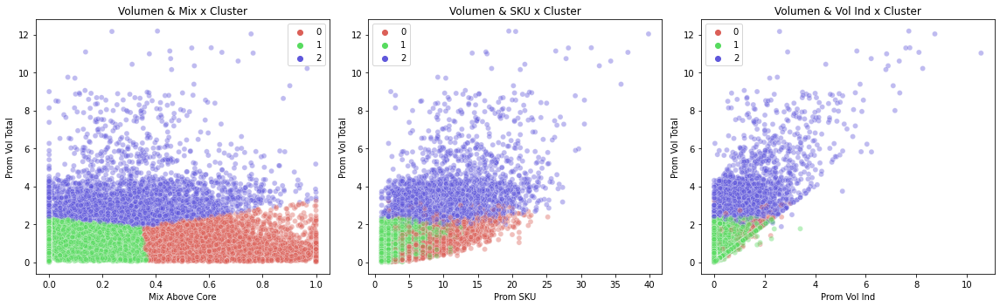

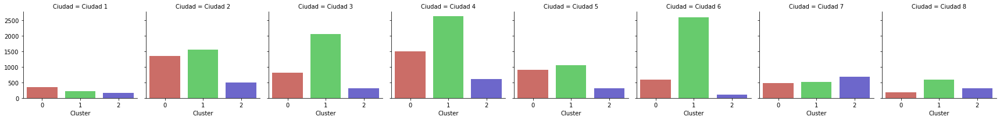

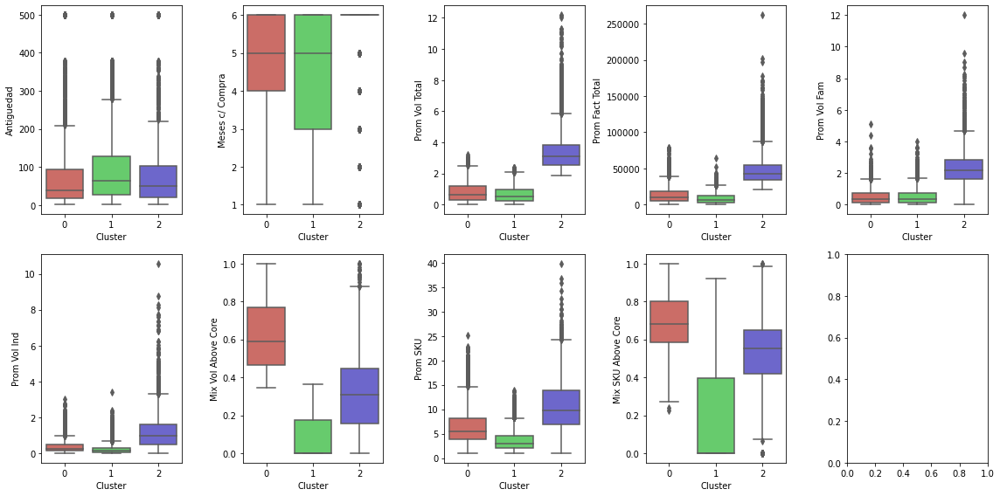

In [128]:
Kmeans(X_scaled,3)
Kmeans2(X_scaled,3)

#### Analizando la composición de cada cluster, se puede identificar las siguientes características:

- Cluster 2 = Clientes de mucho volumen
    - También tienen un promedio mayor de SKUs promedio
- Cluster 1 = Clientes de poco vol y bajo Mix Prem
    - Estos clientes además tienen menor cantidad de skus promedio, y menos volumen individual 
- Cluster 0 = Clientes con poco vol y alto Mix Prem 
    - Cuentan con mayor cantidad de skus, y más vol individual que los clientes de poco volumen y mix

### Análisis para 5 clusters

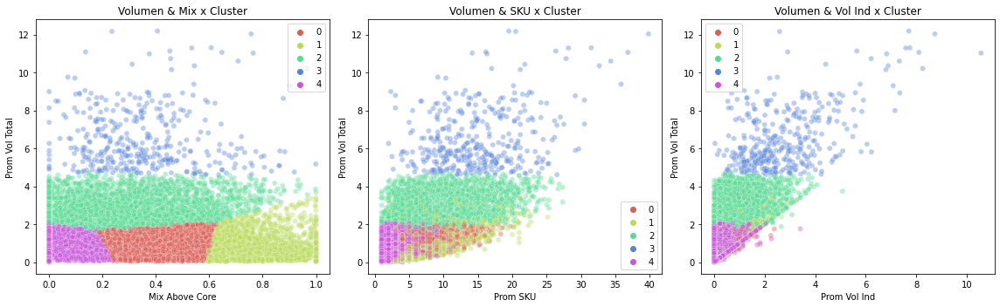

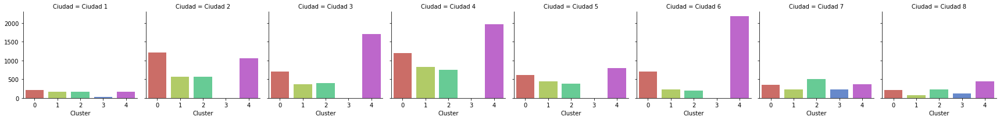

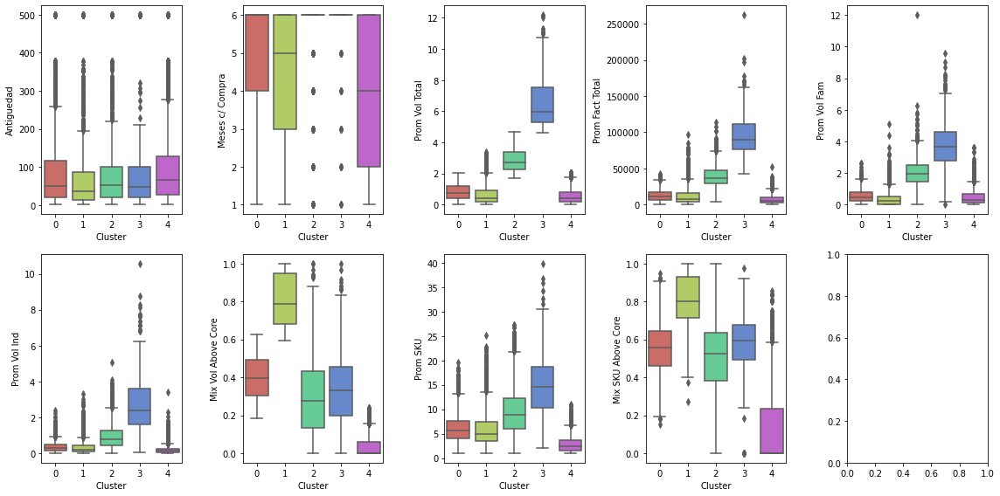

In [129]:
Kmeans(X_scaled,5)
Kmeans2(X_scaled,5)

#### Con 5 clusters, se generan unos 2 cortes por volumen, y a su vez dentro de los clientes de poco volumen 3 cortes por mix. De esta forma:
- Cluster 3: Clientes de muy alto volumen
     - En comparación con el resto, además tiene un promedio de SKUs mayor
- Cluster 2: Clientes de volumen medio/alto
- Cluster 4: Clientes de poco volumne y mix premium
    - Además estos clientes tienen el menor promedio de meses con compra
- Cluster 0: Clientes de poco volumen y mix medio
- Cluster 1: Clientes de poco volumen y alto mix premium
    - En comparación con el cluster 0 (mix medio), no tiene diferencias en los indicadores de Volumen Individual y Prom SKU

#### Ahora busco complejizar el modelo considerando todas las features.

In [130]:
X = dataset.drop(dataset.columns[0], axis=1)
#X = dataset[['Prom Vol Total','Mix Vol Above Core']]

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)

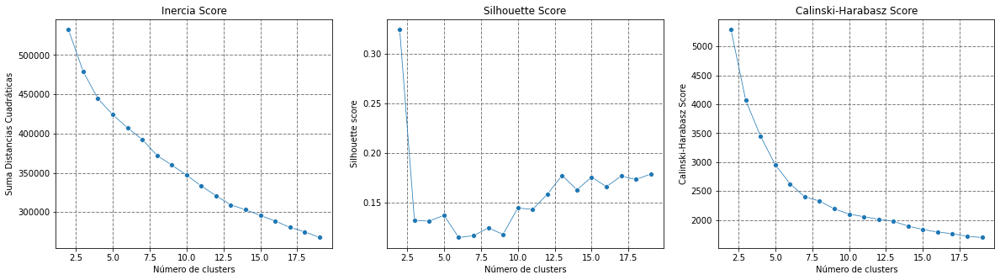

In [131]:
Search_Kmeans(X_scaled)

#### Veo en los gráficos superiores que los resultados no son buenos sin importar la cantidad de clusters. Esto seguramente se deba a las fuertes correlaciones que hay entre las features.
#### Descarto la opción de clusterizar con todas las features. 

#### Otra opción que tengo que analizar a continuación es clusterizar con 4 features. 
#### Además de las 2 que usamos previamente (Volumen Total y Mix Above Core), se suma Volumen Individual y Promedio de SKUs.

In [132]:
#X = dataset.drop(dataset.columns[0], axis=1)
X = dataset[['Prom Vol Total','Mix Vol Above Core','Prom Vol Ind','Prom SKU']]

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)

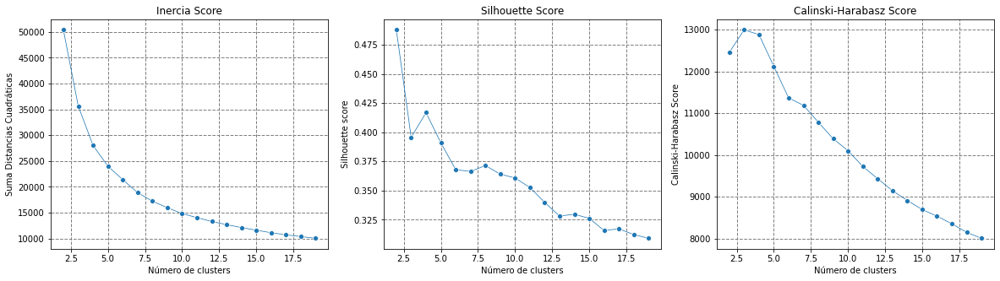

In [133]:
Search_Kmeans(X_scaled)

#### Al analizar los indicadores vo en principio que hay valores más bajos que con solo 2 features. 

#### De todas formas se analiza la composición para 4 clusters

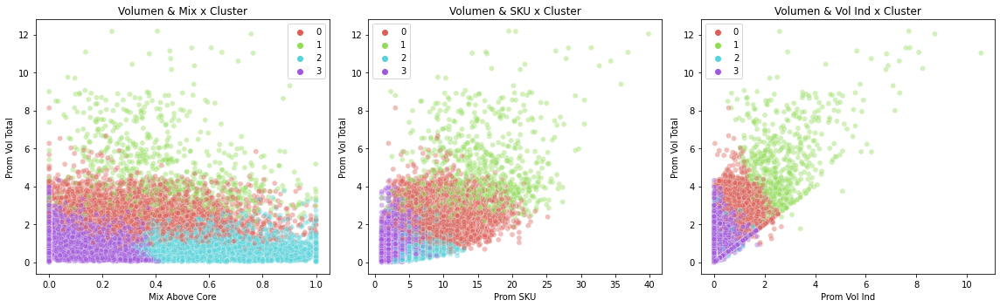

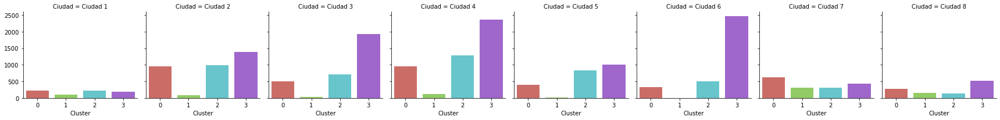

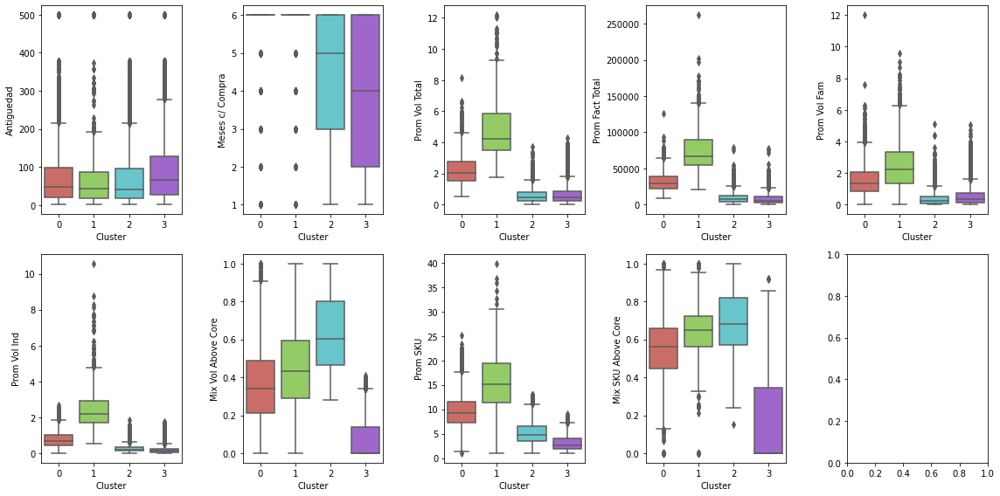

In [134]:
Kmeans(X_scaled,4)
Kmeans2(X_scaled,4)

#### Los clusters son similares a los casos anteriores (cortes por volumen y mix) pero con límites menos definidos. La inclusión de SKUs Promedio y Volumen individual no generó grandes cambios en los lógica de los clusters. Por ejemplo, los clusters de mayor volumen son los que más SKUs promedio tienen, y el de mayor mix premium tiene más SKUs que el de mix bajo. 

#### Hago el gráfico de velas para estos 4 clusters

For n_clusters = 4 The average silhouette_score is : 0.41681128684291807


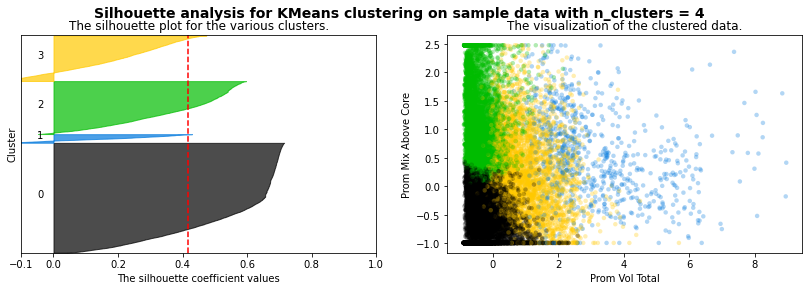

In [135]:
for n_clusters in range(4,5):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(14,4)
    
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_scaled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_scaled[:, 0], X_scaled[:, 1], marker='.', s=80, lw=0, alpha=0.3,
                c=colors, edgecolor='k')
    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Prom Vol Total")
    ax2.set_ylabel("Prom Mix Above Core")
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % n_clusters),fontsize=14, fontweight='bold')

#### Confirmamos la intuición que los límites de algunos clusters no están tan definidos, y varios clientes podrían no estar bien clasificados. 

#### Ahora se clusteriza con el método jerarquico

In [136]:
#X = dataset.drop(dataset.columns[0], axis=1)
X = dataset[['Prom Vol Total','Mix Vol Above Core']]

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)

Z = linkage(X_scaled, 'ward')

''

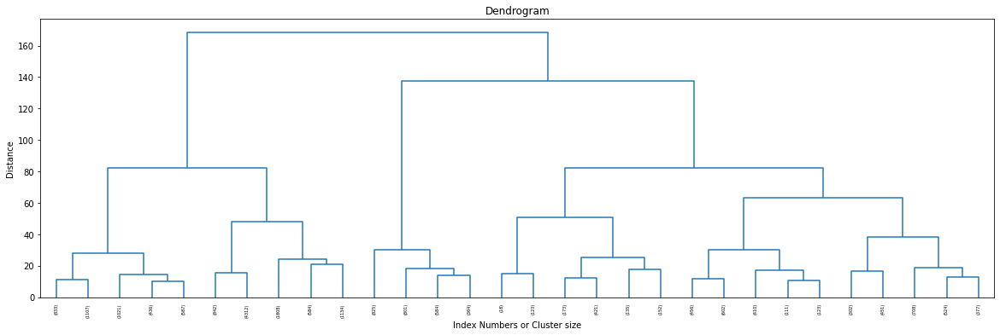

In [137]:
plt.figure(figsize=[20,6]); 
plt.title('Dendrogram'); 
plt.xlabel('Index Numbers or Cluster size'); 
plt.ylabel('Distance')

dendrogram(Z,leaf_rotation=90.,leaf_font_size=5.,color_threshold=0, truncate_mode='lastp' )
;

#### En base al dendograma, hago un corte generando 5 clusters. 

''

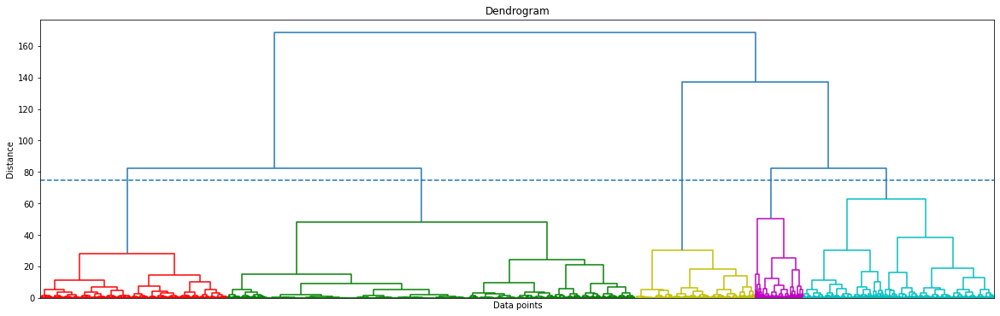

In [138]:
plt.figure(figsize=[20,6]); 
plt.title('Dendrogram'); 
plt.xlabel('Data points'); 
plt.ylabel('Distance')
color_palette=['r','g','y','m','c'];
hierarchy.set_link_color_palette(color_palette)
dendrogram(Z, leaf_rotation=90.,leaf_font_size=5.,color_threshold=75)
plt.hlines(75,0,20000000,linestyle='--')
plt.xticks([])
;

In [139]:
labels=fcluster(Z,5,criterion='maxclust')

frames = [data.reset_index(drop=True) ,pd.DataFrame(labels, columns=['Cluster'])]
result = pd.concat(frames,axis=1)
clusters = result
#clusters.loc[clusters['Cluster'].isin([4])].sort_values("Cluster")
clusters.groupby("Cluster")['Cliente ID'].count()

Cluster
1    3984
2    8680
3    2574
4    1022
5    4064
Name: Cliente ID, dtype: int64

#### Defino las funciones para analizar la composición de los clusters

In [140]:
def jerarquico(X,k):
    Z = linkage(X, 'ward')
    
    labels=fcluster(Z,k,criterion='maxclust')

    frames = [data.reset_index(drop=True) ,pd.DataFrame(labels, columns=['Cluster'])]
    result = pd.concat(frames,axis=1)
    clusters = result
    
    fig, axs = plt.subplots(1,3,figsize=(20,6))
    axs[0].set(xlabel = "Mix Above Core", ylabel = "Prom Vol Total", title = "Volumen & Mix x Cluster")
    axs[2].set(xlabel = "Prom Vol Ind", ylabel = "Prom Vol Total", title = "Volumen & Vol Ind x Cluster")
    axs[1].set(xlabel = "Prom SKU", ylabel = "Prom Vol Total", title = "Volumen & SKU x Cluster")
    sns.scatterplot(ax=axs[0],x=clusters['Mix Vol Above Core'],y=clusters['Prom Vol Total'],hue=labels,legend='full',palette=sns.color_palette("hls", k),alpha=0.4)
    sns.scatterplot(ax=axs[1],x=clusters['Prom SKU'],y=clusters['Prom Vol Total'],hue=labels,legend='full',palette=sns.color_palette("hls", k),alpha=0.4)
    sns.scatterplot(ax=axs[2],x=clusters['Prom Vol Ind'],y=clusters['Prom Vol Total'],hue=labels,legend='full',palette=sns.color_palette("hls", k),alpha=0.4)
    plt.tight_layout()
    g = sns.FacetGrid(clusters, col="Ciudad",hue='Cluster',palette=sns.color_palette("hls", 5),col_order=['Ciudad 1','Ciudad 2','Ciudad 3','Ciudad 4','Ciudad 5','Ciudad 6','Ciudad 7','Ciudad 8'])
    g.map(sns.countplot,'Cluster',order=range(1,k+1))
    ;

In [141]:
def jerarquico2(X,k):
    Z = linkage(X, 'ward')
    
    labels=fcluster(Z,k,criterion='maxclust')

    frames = [data.reset_index(drop=True) ,pd.DataFrame(labels, columns=['Cluster'])]
    result = pd.concat(frames,axis=1)
    clusters = result
    
    fig,ax=plt.subplots(2,5,figsize=(20,10))
    row=0
    col=0
    for i in ['Antiguedad','Meses c/ Compra','Prom Vol Total','Prom Fact Total','Prom Vol Fam', 'Prom Vol Ind','Mix Vol Above Core','Prom SKU','Mix SKU Above Core']:
        sns.boxplot(x=clusters['Cluster'],y=clusters[i],ax=ax[row,col], palette=sns.color_palette("hls", k))
        col+=1
        if col>4:
            row+=1
            col=0
    plt.tight_layout()
    ;

#### Analizo para 5 clusters

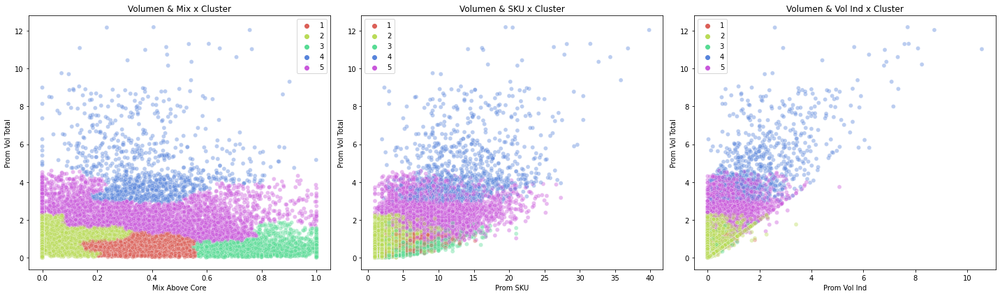

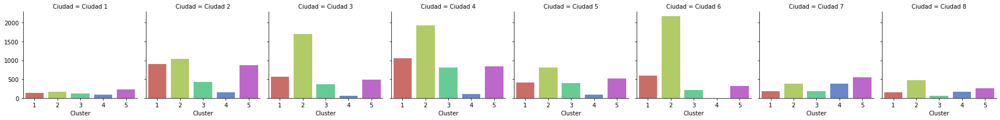

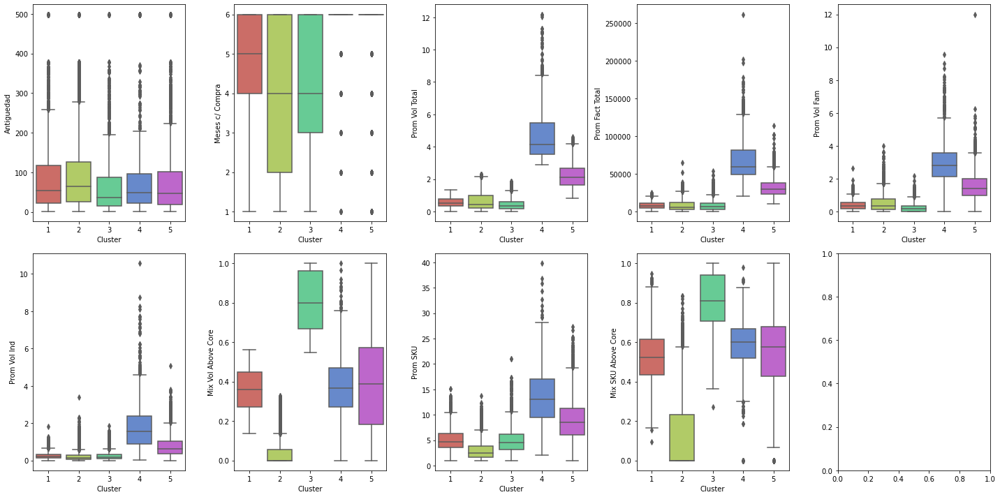

In [142]:
jerarquico(X_scaled,5)
jerarquico2(X_scaled,5)

#### En comparación con los clusters de Kmeans, se veque los clusters están más superpuestos, y los criterios de corte no son tan claros.

#### Mismo análisis para 4 clusters:

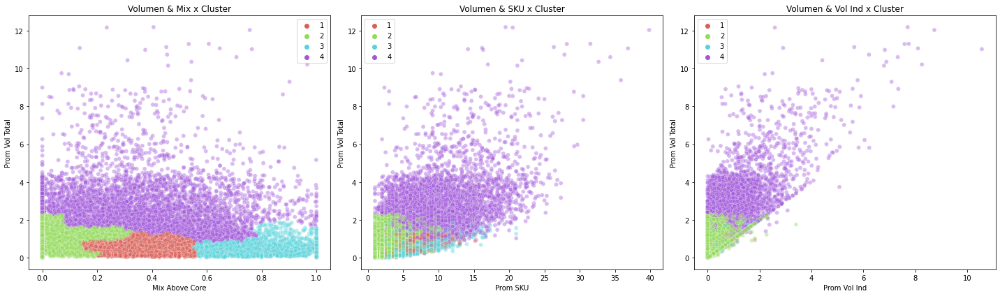

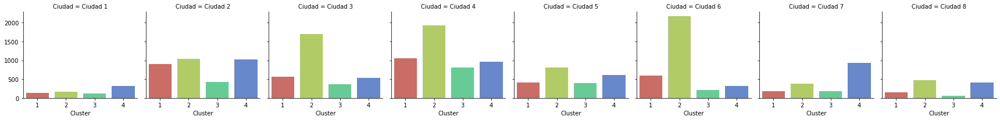

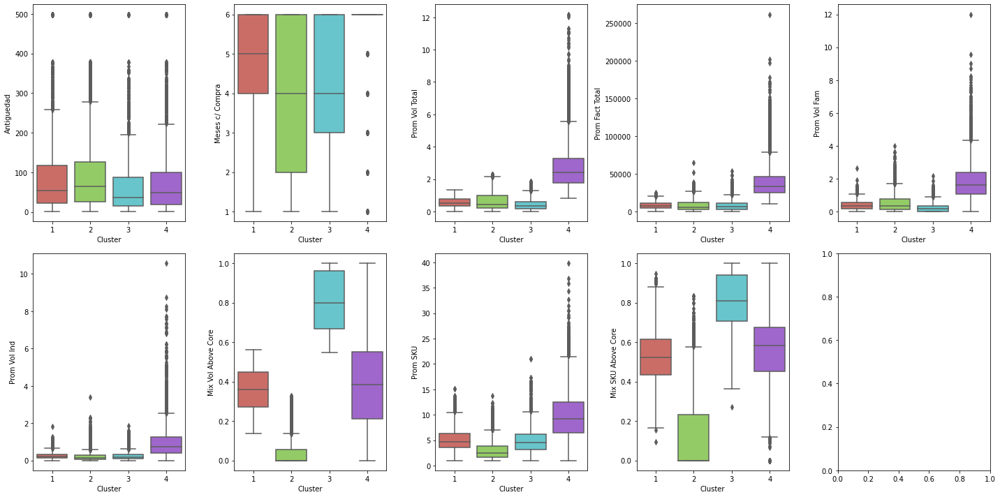

In [143]:
jerarquico(X_scaled,4)
jerarquico2(X_scaled,4)

#### Idem anterior

#### Para 3 clusters

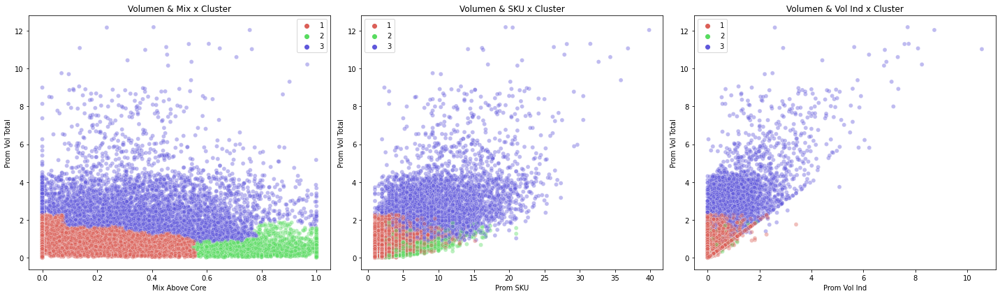

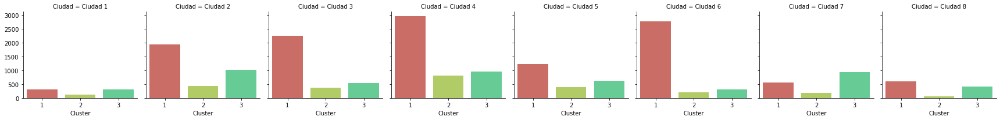

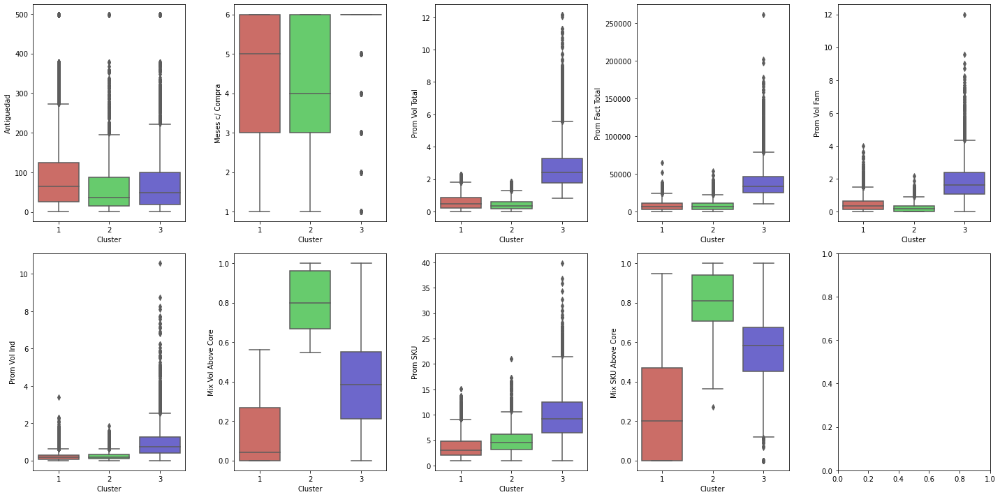

In [144]:
jerarquico(X_scaled,3)
jerarquico2(X_scaled,3)

#### Este último es más parecido a Kmeans(k=3), pero tengo más superpisición y menor claridad.

#### Por último se tiene que corregir clustering jerárquico para las 4 features. 

''

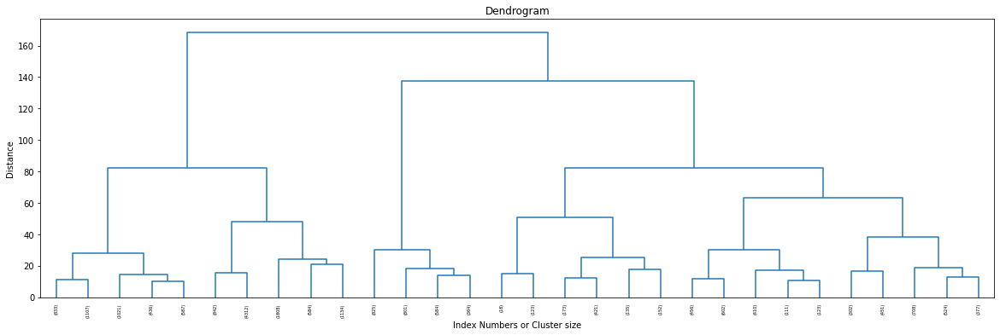

In [145]:
X = dataset[['Prom Vol Total','Mix Vol Above Core','Prom Vol Ind','Prom SKU']]

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)

plt.figure(figsize=[20,6]); 
plt.title('Dendrogram'); 
plt.xlabel('Index Numbers or Cluster size'); 
plt.ylabel('Distance')

dendrogram(Z,leaf_rotation=90.,leaf_font_size=5.,color_threshold=0, truncate_mode='lastp' )
;

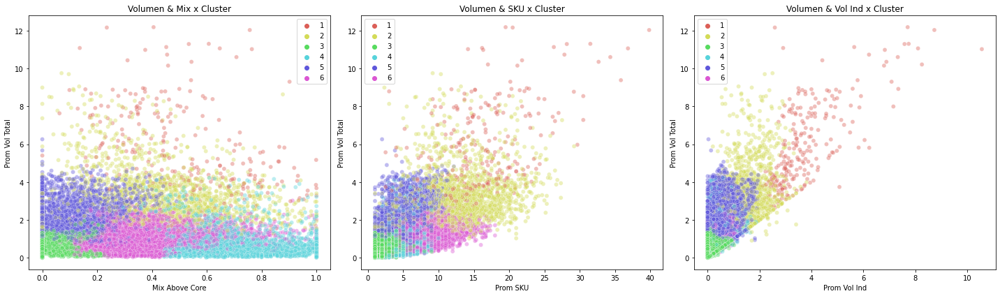

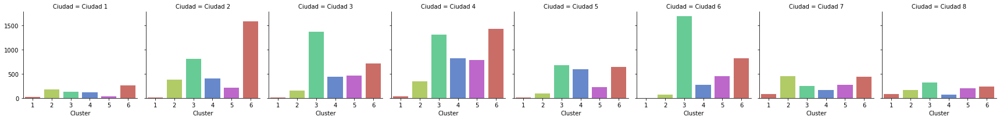

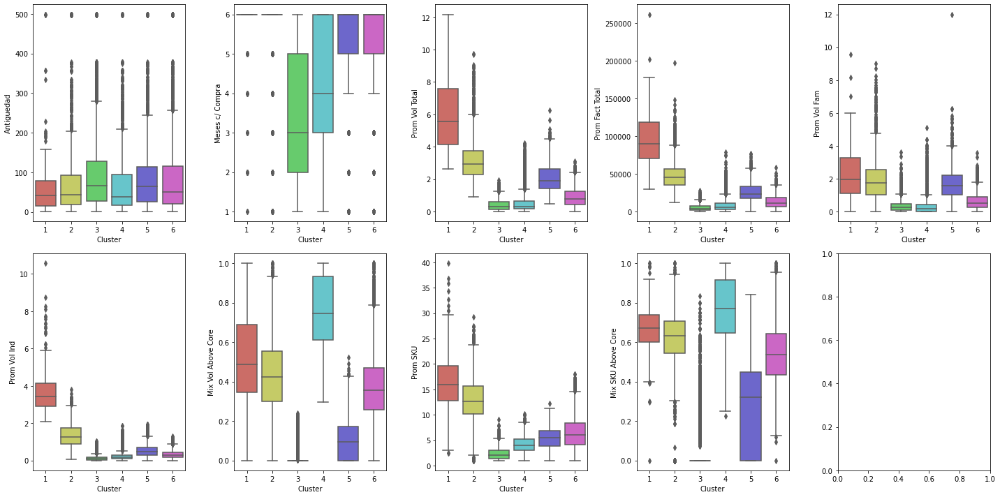

In [146]:
jerarquico(X_scaled,6)
jerarquico2(X_scaled,6)

#### Veo que entre los clusters 1 y 2 que son los de mayor volumen, la diferencia está prinpalmente en el volumen individual, y volumen familiar es muy similar.
#### Los clientes del cluster 3 que tienen poco volumen y un mix premium muy bajo además tienen el menor promedio de meses con compra (3 meses), pero tienen el mayor promedio de antigüedad. 

#### Análisis para 5 clusters

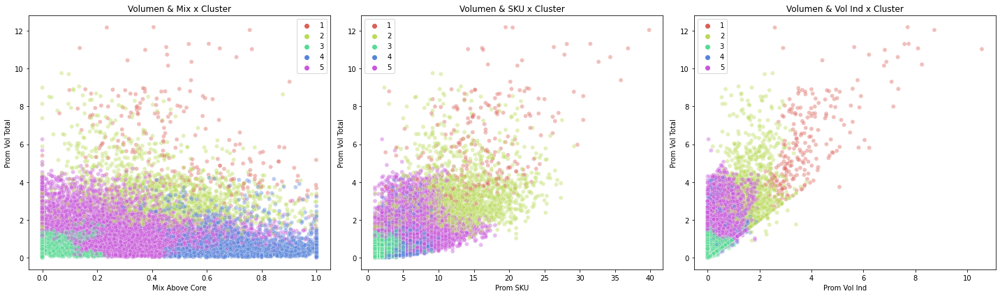

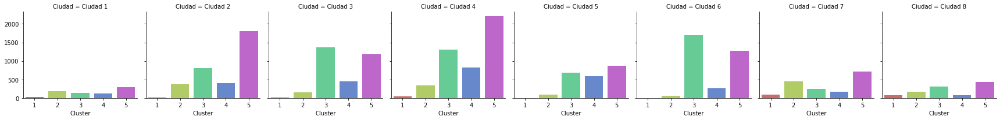

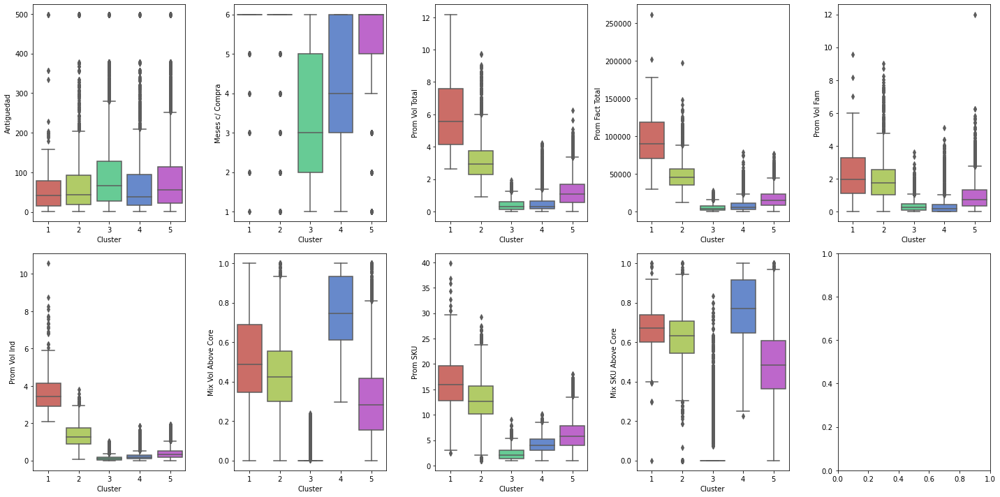

In [147]:
jerarquico(X_scaled,5)
jerarquico2(X_scaled,5)

#### Análisis para 4 clusters

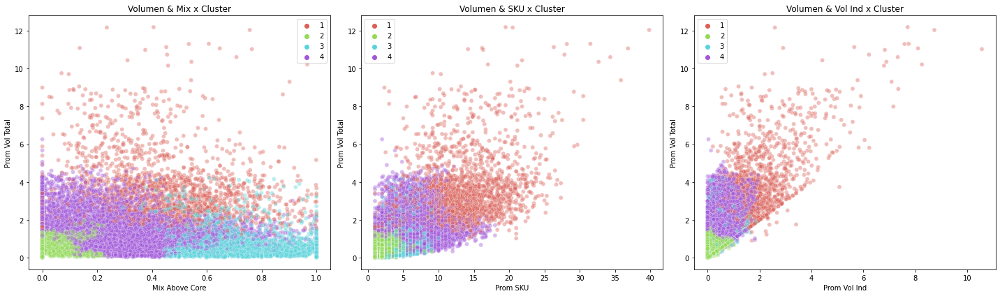

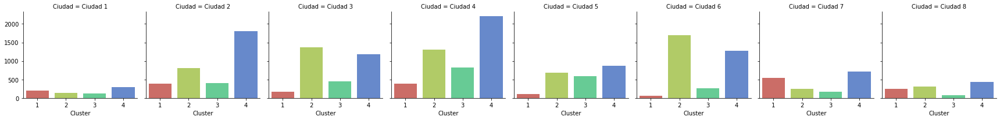

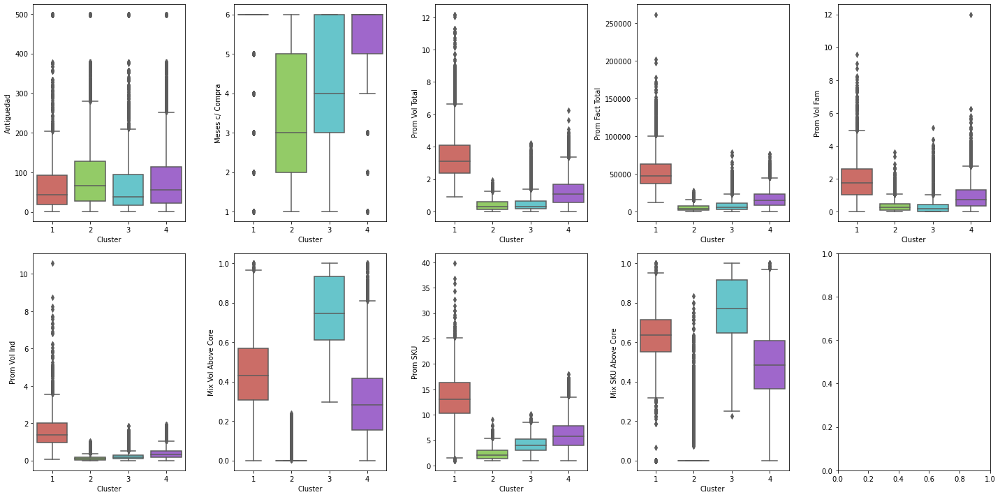

In [148]:
jerarquico(X_scaled,4)
jerarquico2(X_scaled,4)

#### A continuación se hace una reducción de las dimensiones con PCA, quedandome con los componentes principales que mayor variabilidad expliquen. 

In [149]:
X = dataset.drop(dataset.columns[0], axis=1)
#X = dataset[['Prom Vol Total','Mix Vol Above Core']]

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)

In [150]:
pca_df = PCA()
pca_df.fit(X_scaled)

PCA()

In [151]:
pca_df.explained_variance_ratio_.round(2)

array([0.33, 0.12, 0.07, 0.05, 0.05, 0.04, 0.04, 0.04, 0.03, 0.03, 0.03,
       0.03, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.01, 0.01, 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ])

#### Los primeros 2 componentes explican casi el 50%, y los primeros 5 el 62%

In [152]:
pca_loadings = pd.DataFrame(pca_df.components_.T, index=X.columns).iloc[:,:5]
pca_loadings.rename(columns = {0 : 'CP1', 1 : 'CP2',2 : 'CP3',3 : 'CP4',4 : 'CP5'}, inplace = True)
pca_loadings.style.background_gradient(axis=None,cmap='coolwarm')

,CP1,CP2,CP3,CP4,CP5
Antiguedad,-0.016950,0.080836,0.009038,-0.005812,-0.226524
Meses c/ Compra,0.133668,0.002428,0.066427,-0.236057,-0.230507
Prom Vol Total,0.276316,0.171260,-0.064256,-0.032440,0.009299
Prom Fact Total,0.287336,0.106934,-0.080918,0.052393,0.040835
Prom Vol Prem,0.234498,-0.087050,-0.108985,0.227665,0.114751
Prom Fact Prem,0.226841,-0.098105,-0.110270,0.268130,0.133760
Prom Vol Core Plus,0.226777,-0.078156,-0.051633,-0.166477,0.224828
Prom Fact Core Plus,0.235462,-0.093302,-0.060434,-0.116887,0.207819
Prom Vol Core,0.214396,0.294061,-0.067074,-0.055032,-0.107599
Prom Fact Core,0.216746,0.286646,-0.070404,-0.020366,-0.110863


#### Tal como se intuia en los componentes que más explican la variabilidad están influidos por las variables de volumen el 1ro y Mix Above Core el 2do.
#### En el 3er componente veo como influyen la marcas Value y luego ya se empieza a complejizar el entendimiento de los componentes.

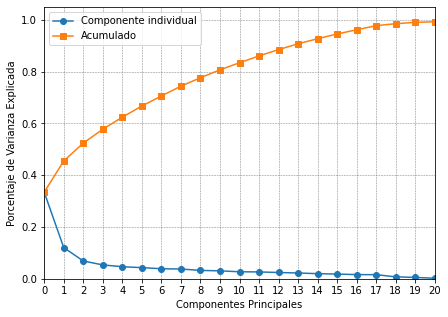

In [153]:
plt.figure(figsize=(7,5))

plt.plot(pca_df.explained_variance_ratio_, '-o', label='Componente individual')
plt.plot(np.cumsum(pca_df.explained_variance_ratio_), '-s', label='Acumulado')

plt.ylabel('Porcentaje de Varianza Explicada')
plt.xlabel('Componentes Principales')
plt.xlim(0.75,4.25)
plt.ylim(0,1.05)
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20])
plt.grid(color='gray', linewidth=0.5, ls='--')
plt.legend(loc=2);

#### Genero el set de features con los 5 primeros componentes principales y clusterizo con kmeans. 

In [154]:
name_columns = ['CP1', 'CP2', 'CP3', 'CP4','CP5']
df_pca = pd.DataFrame(pca_df.transform(X)[:,:5], columns=name_columns, index=dataset.index)
df_pca.head(5)

,CP1,CP2,CP3,CP4,CP5
6,130756.805605,21481.367309,-42747.756716,50262.670646,36900.757477
10,115499.514433,25671.497541,-36880.434694,44022.872276,27922.010479
15,108682.532293,29532.058198,-32569.830800,30185.708786,24732.728558
23,122320.934527,22373.862384,-40609.199252,50395.989861,32128.599722
32,104487.557268,29705.907094,-28729.884789,33721.863245,23281.309458


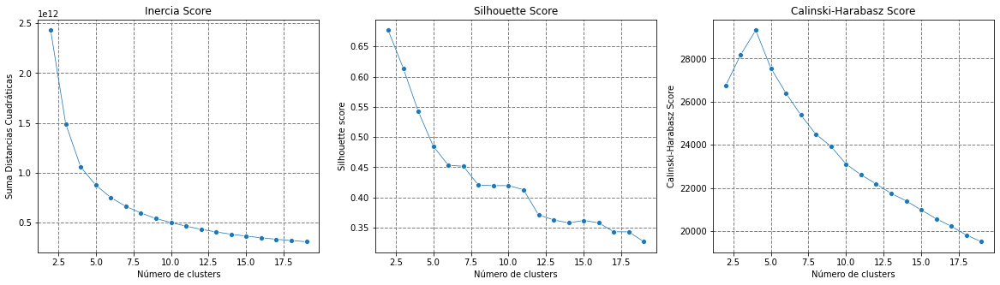

In [155]:
Search_Kmeans(df_pca)

For n_clusters = 3 The average silhouette_score is : 0.613864096668727


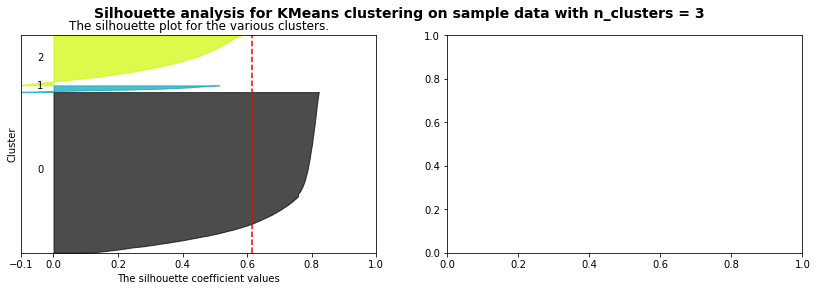

In [156]:
for n_clusters in range(3,4):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(14,4)
    
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_pca)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_pca, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_pca, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % n_clusters),fontsize=14, fontweight='bold')

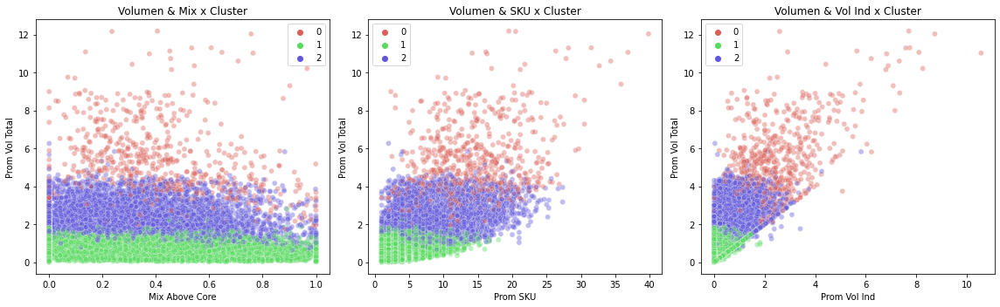

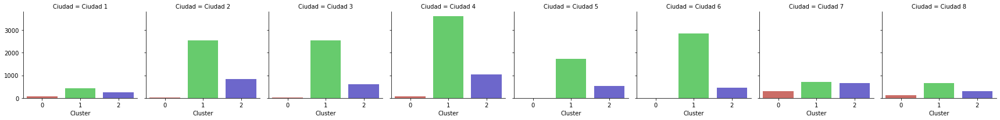

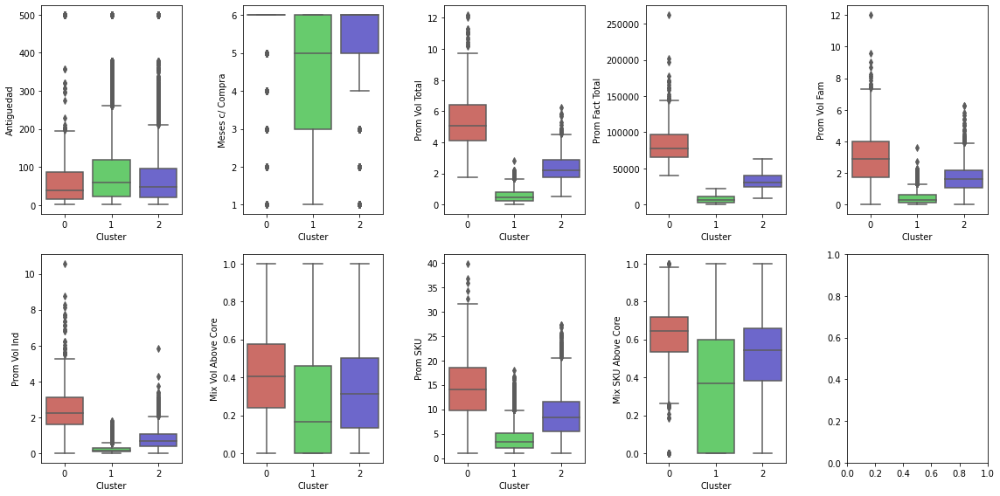

In [157]:
Kmeans(df_pca,3)
Kmeans2(df_pca,3)

#### Como no escale, el componente principal 1 queda con un peso mucho mayor que el resto. Con este método los cortes entre clusters queda básicamente por volumen. 

#### Escalo los componentes para que todos tengan el mismo peso en la clusterización. 

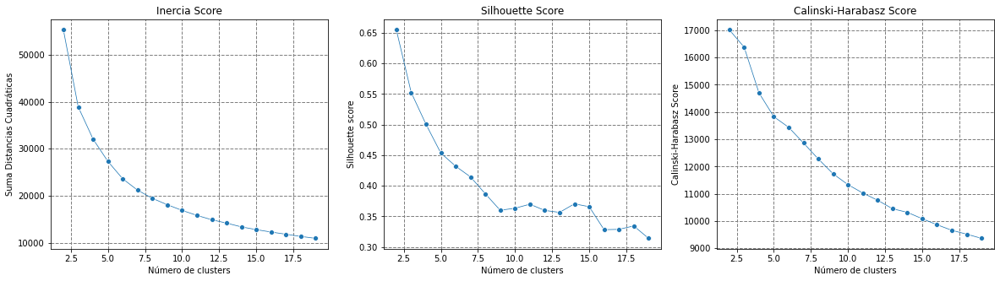

In [158]:
scaler=StandardScaler()
pca_scaled=scaler.fit_transform(df_pca)

Search_Kmeans(pca_scaled)

For n_clusters = 3 The average silhouette_score is : 0.5542201881791708


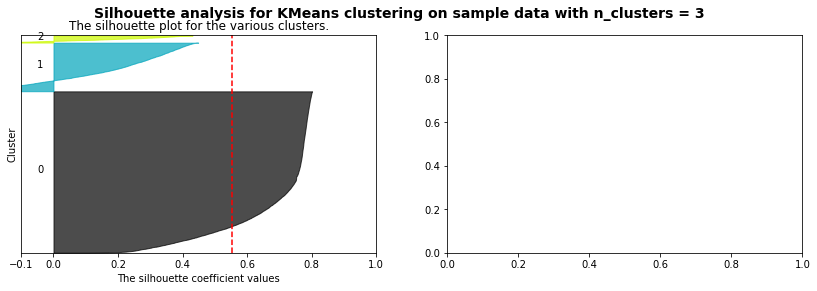

In [159]:
for n_clusters in range(3,4):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(14,4)
    
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(pca_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(pca_scaled, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(pca_scaled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % n_clusters),fontsize=14, fontweight='bold')

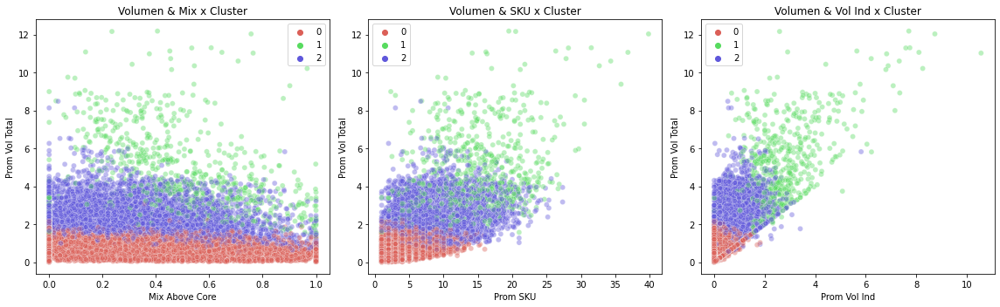

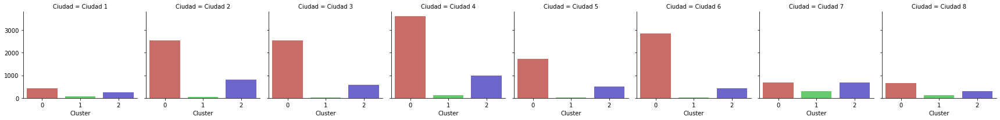

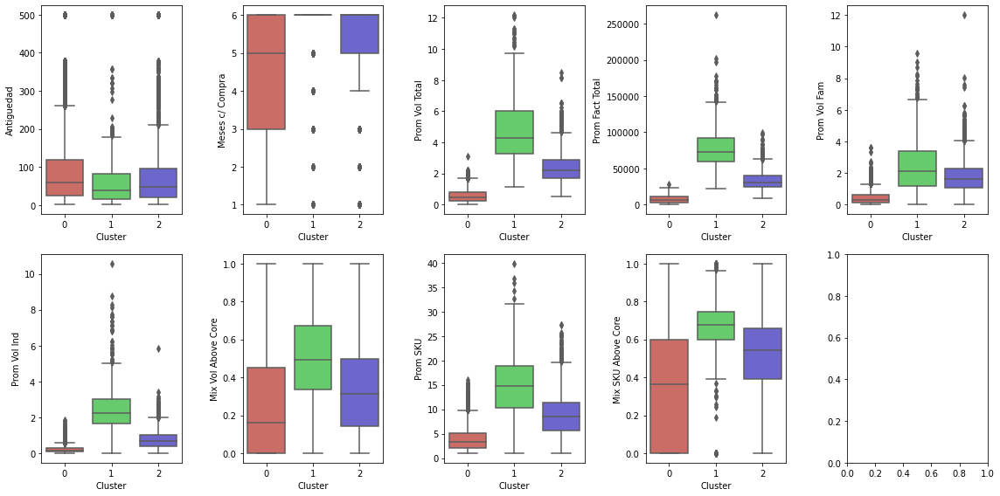

In [160]:
Kmeans(pca_scaled,3)
Kmeans2(pca_scaled,3)

''

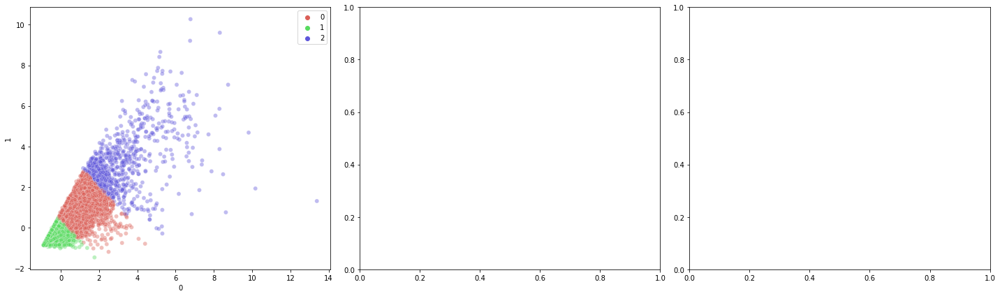

In [161]:
kmeans = KMeans(n_clusters=3,n_init=10,random_state=0)
kmeans.fit(pca_scaled[:,:2])
labels = kmeans.labels_ 
frames = [pd.DataFrame(pca_scaled[:,:2]) ,pd.DataFrame(labels, columns=['Cluster'])]
result = pd.concat(frames, axis=1)
clusters = result
    
fig, axs = plt.subplots(1,3,figsize=(20,6))
sns.scatterplot(ax=axs[0],x=clusters.iloc[:,0],y=clusters.iloc[:,1],hue=labels,legend='full',palette=sns.color_palette("hls", 3),alpha=0.4)

plt.tight_layout()
;

<a id='d'> </a>
## 4- CONCLUSIONES 
##### [Indice](#d1)


#### El primer modelo que era el más simple, Kmeans con 2 variables (Volumen Total y Mix Above Core) y 3 clusters, es el que más sirve. Brinda diferencias claras entre clusters, es fácil de interpretar para el negocio y tienen buena distribución entre las ciudades. En base a esto se podrán tomar acciones diferenciales por clusters.
#### Como paso posterior, podría usar los clusters como input para definir los valores de corte y re-clusterizar manualmente. Si bien los límites son bastante claros al graficar, Kmeans suele funcionar bien con clusters de forma circular, por lo cual no tengo líneas rectas. Sería más útil e interpretable para el negocio que pueda definir los clusters en base a reglas, por ejemplo Cluster 2 clientes con volumen promedio mensual mayor a 2 HL.

#### Con el modelo seleccionado, la caracterización de los clusters es la siguiente:
- Cluster 2 = Clientes de mucho volumen
    -También tienen un promedio mayor de SKUs promedio
- Cluster 1 = Clientes de Poco vol y Bajo Mix Prem
    -Estos clientes además tienen menor cantidad de skus promedio, y menos volumen individual
- Cluster 0 = Clientes con poco vol y Alto Mix Prem
    -Cuentan con mayor cantidad de skus, y más vol individual que los clientes de poco volumen y mix
- A estos debemos agregar el 1er cluster que habíamos generado de clientes Simil Mayoristas.

<a id='e'> </a>
## 5- Pipeline
##### [Indice](#e1)
#### 
#### Defino una clase para hacer la selección de features.

In [162]:
class FeatureSelection(BaseEstimator, TransformerMixin):
    def __init__(self,selected_features):
        self.selected_features=selected_features

    def fit(self,X,y=None):
        return self
    
    def transform(self, X, y=None):
        return X[self.selected_features]

In [163]:
pipeline_scaler = StandardScaler()

#### Ahora genero el Pipeline con las features seleccionadas, escalando y corriendo Kmeans. 

In [164]:
pipeline_kmeans = make_pipeline(FeatureSelection(['Prom Vol Total','Mix Vol Above Core']),pipeline_scaler,KMeans(n_clusters=3,n_init=10,random_state=0))

In [165]:
pipeline_kmeans.fit(dataset)

Pipeline(steps=[('featureselection',
                 FeatureSelection(selected_features=['Prom Vol Total',
                                                     'Mix Vol Above Core'])),
                ('standardscaler', StandardScaler()),
                ('kmeans', KMeans(n_clusters=3, random_state=0))])

In [166]:
pipeline_kmeans.predict(dataset)

array([2, 2, 2, ..., 1, 1, 1])

#### Genero una función que corra todos los cálculos de indicadores que hice al inicio, y a continuación el pipeline. De esta forma cada vez que tenga bases nuevas puedo correr la función y generar el dataset con los indicadores que necesito. 

In [167]:
def cluster_automatico(Base_Venta,Base_Clientes):
    location1 = "C:/Users/Julian/Documents/Data Science/Desafío 4/"+Base_Venta+".csv"
    location2 = "C:/Users/Julian/Documents/Data Science/Desafío 4/"+Base_Clientes+".csv"
    location3 = "C:/Users/Julian/Documents/Data Science/Desafío 4/Calibre Envases.csv"
    location4 = "C:/Users/Julian/Documents/Data Science/Desafío 4/Marca Segmento.csv"
    venta = pd.read_csv(location1, delimiter = ";", decimal= "," , thousands=".")
    clientes = pd.read_csv(location2,delimiter = ";")
    Envases = pd.read_csv(location3,delimiter = ";")
    Segmentos = pd.read_csv(location4,delimiter = ";")
    
    venta.rename(columns={"Año Mes Cierre": "Fecha","Alias Cliente Id": "Cliente ID", "Suma de #HL Vta Bruta": "Hectolitros", "Suma de $ Fact": "Facturacion" }, inplace = True)
    clientes.rename(columns={"Alias Cliente Id": "Cliente ID", "Localidad 12": "Localidad"}, inplace = True)
    clientes['Fecha de Alta']=pd.to_datetime(clientes['Fecha de Alta'])
    clientes.loc[clientes['Fecha de Baja'] == '31/12/9999','Fecha de Baja']='31/12/2022'
    clientes['Fecha de Baja']=pd.to_datetime(clientes['Fecha de Baja'])
    fechamal=clientes[clientes['Fecha de Alta'] > pd.to_datetime('2021-07-30',format="%Y-%m-%d")]
    clientesmal=fechamal['Cliente ID'].unique()
    maskfechamal = venta['Cliente ID'].isin(clientesmal)
    venta=venta[~maskfechamal]
    Envases.rename(columns={"Unnamed: 1": "Envases"}, inplace = True)
    dfventa = venta.merge(right=Envases.reset_index()[['Calibre','Envases']].drop_duplicates(), on='Calibre', how='left')
    dfventa = dfventa.merge(right=Segmentos.reset_index()[['Marca','Segmento']].drop_duplicates(), on='Marca', how='left')
    dfventa = dfventa.merge(right=clientes.reset_index()[['Cliente ID','Ciudad','Localidad','Canal','Perfil Impositivo','Fecha de Alta','Fecha de Baja','Estado']].drop_duplicates(), on='Cliente ID', how='left')
    maskact =(dfventa.Estado == 'Activo')
    dfventa = dfventa[maskact]
    
    data = dfventa[['Cliente ID','Canal']].value_counts().reset_index()
    data = data.drop(columns = [0])
    data = data.merge(right=dfventa.reset_index()[['Cliente ID','Ciudad','Localidad','Perfil Impositivo','Fecha de Alta']].drop_duplicates(), on='Cliente ID', how='left')
    Antiguedad = pd.to_datetime('2021-08-01',format="%Y-%m-%d") - data['Fecha de Alta']
    data['Antiguedad'] = round(Antiguedad / np.timedelta64(1,'M'))
    data = data[data['Antiguedad'] > 0 ]
    tablamesescc= dfventa.groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
    MesesConCompra = tablamesescc['Cliente ID'].value_counts().reset_index().rename(columns={"index": "Cliente ID","Cliente ID": "Meses c/ Compra" })
    data = data.merge(right=MesesConCompra.reset_index()[['Cliente ID','Meses c/ Compra']].drop_duplicates(), on='Cliente ID', how='left')
    tablatotal= dfventa.groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
    tablatotal=round(tablatotal.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    data = data.merge(right=tablatotal.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
    data.rename(columns={"Hectolitros": "Prom Vol Total","Facturacion": "Prom Fact Total"}, inplace = True)
    tablaPrem= dfventa[dfventa['Segmento'] == 'Premium'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
    tablaPrem=round(tablaPrem.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    data = data.merge(right=tablaPrem.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
    data.rename(columns={"Hectolitros": "Prom Vol Prem","Facturacion": "Prom Fact Prem"}, inplace = True)
    tablacoreplus= dfventa[dfventa['Segmento'] == 'Core Plus'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
    tablacoreplus=round(tablacoreplus.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    data = data.merge(right=tablacoreplus.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
    data.rename(columns={"Hectolitros": "Prom Vol Core Plus","Facturacion": "Prom Fact Core Plus"}, inplace = True)
    tablacore= dfventa[dfventa['Segmento'] == 'Core'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
    tablacore=round(tablacore.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    data = data.merge(right=tablacore.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
    data.rename(columns={"Hectolitros": "Prom Vol Core","Facturacion": "Prom Fact Core"}, inplace = True)
    tablavalue= dfventa[dfventa['Segmento'] == 'Value'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
    tablavalue=round(tablavalue.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    data = data.merge(right=tablavalue.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
    data.rename(columns={"Hectolitros": "Prom Vol Value","Facturacion": "Prom Fact Value"}, inplace = True)
    tablafam= dfventa[dfventa['Envases'] == 'Familiar'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
    tablafam=round(tablafam.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    data = data.merge(right=tablafam.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
    data.rename(columns={"Hectolitros": "Prom Vol Fam","Facturacion": "Prom Fact Fam"}, inplace = True)
    tablaind= dfventa[dfventa['Envases'] == 'Individual'] .groupby(by=['Cliente ID','Fecha'])[['Hectolitros','Facturacion']].sum().reset_index()
    tablaind=round(tablaind.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    data = data.merge(right=tablaind.reset_index()[['Cliente ID','Hectolitros','Facturacion']].drop_duplicates(), on='Cliente ID', how='left')
    data.rename(columns={"Hectolitros": "Prom Vol Ind","Facturacion": "Prom Fact Ind"}, inplace = True)
    tablamix= dfventa.pivot_table(index='Cliente ID', columns='Segmento',values='Hectolitros',aggfunc='sum',margins=True)
    tablamix['Mix Vol Above Core'] = (tablamix['Premium'] + tablamix['Core Plus']) / tablamix['All']
    data = data.merge(right=tablamix.reset_index()[['Cliente ID','Mix Vol Above Core']].drop_duplicates(), on='Cliente ID', how='left')
    tablamixf= dfventa.pivot_table(index='Cliente ID', columns='Segmento',values='Facturacion',aggfunc='sum',margins=True)
    tablamixf['Mix Fact Above Core'] = (tablamixf['Premium'] + tablamixf['Core Plus']) / tablamixf['All']
    data = data.merge(right=tablamixf.reset_index()[['Cliente ID','Mix Fact Above Core']].drop_duplicates(), on='Cliente ID', how='left')
    data.fillna(0,inplace=True)
    tablasku= dfventa.groupby(by=['Cliente ID','Fecha'])['Hectolitros'].count().reset_index()
    tablasku=round(tablasku.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    tablasku.rename(columns={"Hectolitros": "Prom SKU"}, inplace = True)
    data = data.merge(right=tablasku.reset_index()[['Cliente ID','Prom SKU']].drop_duplicates(), on='Cliente ID', how='left')
    tablaskuprem= dfventa[dfventa['Segmento']=='Premium'] .groupby(by=['Cliente ID','Fecha'])['Hectolitros'].count().reset_index()
    tablaskuprem=round(tablaskuprem.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    tablaskuprem.rename(columns={"Hectolitros": "Prom SKU Prem"}, inplace = True)
    data = data.merge(right=tablaskuprem.reset_index()[['Cliente ID','Prom SKU Prem']].drop_duplicates(), on='Cliente ID', how='left')
    tablaskucoreplus= dfventa[dfventa['Segmento']=='Core Plus'] .groupby(by=['Cliente ID','Fecha'])['Hectolitros'].count().reset_index()
    tablaskucoreplus=round(tablaskucoreplus.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    tablaskucoreplus.rename(columns={"Hectolitros": "Prom SKU Core Plus"}, inplace = True)
    data = data.merge(right=tablaskucoreplus.reset_index()[['Cliente ID','Prom SKU Core Plus']].drop_duplicates(), on='Cliente ID', how='left')
    tablaskucore= dfventa[dfventa['Segmento']=='Core'] .groupby(by=['Cliente ID','Fecha'])['Hectolitros'].count().reset_index()
    tablaskucore=round(tablaskucore.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    tablaskucore.rename(columns={"Hectolitros": "Prom SKU Core"}, inplace = True)
    data = data.merge(right=tablaskucore.reset_index()[['Cliente ID','Prom SKU Core']].drop_duplicates(), on='Cliente ID', how='left')
    tablaskuvalue= dfventa[dfventa['Segmento']=='Value'] .groupby(by=['Cliente ID','Fecha'])['Hectolitros'].count().reset_index()
    tablaskuvalue=round(tablaskuvalue.groupby('Cliente ID').mean().drop(columns='Fecha'),2)
    tablaskuvalue.rename(columns={"Hectolitros": "Prom SKU Value"}, inplace = True)
    data = data.merge(right=tablaskuvalue.reset_index()[['Cliente ID','Prom SKU Value']].drop_duplicates(), on='Cliente ID', how='left')
    tablamixsku= dfventa.pivot_table(index='Cliente ID', columns='Segmento',values='Hectolitros',aggfunc='count',margins=True)
    tablamixsku['Mix SKU Above Core'] = (tablamixsku['Premium'] + tablamixsku['Core Plus']) / tablamixsku['All']
    data = data.merge(right=tablamixsku.reset_index()[['Cliente ID','Mix SKU Above Core']].drop_duplicates(), on='Cliente ID', how='left')
    data.fillna(0,inplace=True)
    maskkt = ((data['Canal'] == 'Tradicional') | (data['Canal'] == 'Kiosco'))
    data=data[maskkt]
    
    Q1 = data.groupby(['Canal','Ciudad']).quantile(0.25)[['Prom Vol Total']]
    Q3 = data.groupby(['Canal','Ciudad']).quantile(0.75)[['Prom Vol Total']]
    RIC = Q3 - Q1
    outlier = Q3 + (1.5 * RIC)
    data = data.merge(outlier.reset_index().rename(columns={'Prom Vol Total':'outlier'}),how='left',on=['Canal','Ciudad'])
    es_outlier = data.apply(lambda x: 1 if x['Prom Vol Total'] >= x.outlier else 0, axis = 1)
    data['es_outlier'] = es_outlier
    Simil_Mayoristas = data[data['es_outlier']==1]
    data = data[data.es_outlier == 0]
    
    dummies_canal=pd.get_dummies(data.Canal, drop_first=True)
    data=pd.concat([data,dummies_canal], axis=1)
    dummies_ciudad=pd.get_dummies(data.Ciudad, drop_first=True)
    data=pd.concat([data,dummies_ciudad], axis=1)
    dummies_perfil=pd.get_dummies(data['Perfil Impositivo'], drop_first=True)
    data=pd.concat([data,dummies_perfil], axis=1)
    dataset = data.drop(columns=['Canal','Ciudad','Perfil Impositivo','Localidad','Fecha de Alta','outlier','es_outlier'])
    
    labels = pipeline_kmeans.predict(dataset)
    frames = [data.reset_index(drop=True) ,pd.DataFrame(labels, columns=['Cluster'])]
    result = pd.concat(frames, axis=1)
    clusters = result
    
    clusters.loc[clusters['Cluster']==0,'Cluster'] = 'Bajo Vol - Alto Mix'
    clusters.loc[clusters['Cluster']==1,'Cluster'] = 'Bajo Vol - Bajo Mix'
    clusters.loc[clusters['Cluster']==2,'Cluster'] = 'Medio Vol'
    
    fig, axs = plt.subplots(1,3,figsize=(20,6))
    axs[0].set(xlabel = "Mix Above Core", ylabel = "Prom Vol Total", title = "Volumen & Mix x Cluster")
    axs[2].set(xlabel = "Prom Vol Ind", ylabel = "Prom Vol Total", title = "Volumen & Vol Ind x Cluster")
    axs[1].set(xlabel = "Prom SKU", ylabel = "Prom Vol Total", title = "Volumen & SKU x Cluster")
    sns.scatterplot(ax=axs[0],x=clusters['Mix Vol Above Core'],y=clusters['Prom Vol Total'],hue=clusters['Cluster'] ,legend='full',palette=sns.color_palette("hls", 3),alpha=0.4,hue_order=['Bajo Vol - Bajo Mix','Bajo Vol - Alto Mix','Medio Vol'])
    sns.scatterplot(ax=axs[1],x=clusters['Prom SKU'],y=clusters['Prom Vol Total'],hue=clusters['Cluster'],legend='full',palette=sns.color_palette("hls", 3),alpha=0.4,hue_order=['Bajo Vol - Bajo Mix','Bajo Vol - Alto Mix','Medio Vol'])
    sns.scatterplot(ax=axs[2],x=clusters['Prom Vol Ind'],y=clusters['Prom Vol Total'],hue=clusters['Cluster'],legend='full',palette=sns.color_palette("hls", 3),alpha=0.4,hue_order=['Bajo Vol - Bajo Mix','Bajo Vol - Alto Mix','Medio Vol'])
    plt.tight_layout()
    g = sns.FacetGrid(clusters, col="Ciudad",hue='Cluster',palette=sns.color_palette("hls", 3),col_order=['Ciudad 1','Ciudad 2','Ciudad 3','Ciudad 4','Ciudad 5','Ciudad 6','Ciudad 7','Ciudad 8'],hue_order=['Bajo Vol - Bajo Mix','Bajo Vol - Alto Mix','Medio Vol'])
    g.map(sns.countplot,'Cluster',order=['Bajo Vol - Bajo Mix','Bajo Vol - Alto Mix','Medio Vol'])
       
    fig,ax=plt.subplots(2,5,figsize=(20,8))
    row=0
    col=0
    for i in ['Antiguedad','Meses c/ Compra','Prom Vol Total','Prom Fact Total','Prom Vol Fam', 'Prom Vol Ind','Mix Vol Above Core','Prom SKU','Mix SKU Above Core']:
        sns.boxplot(x=clusters['Cluster'],y=clusters[i],ax=ax[row,col], palette=sns.color_palette("hls", 3),order=['Bajo Vol - Bajo Mix','Bajo Vol - Alto Mix','Medio Vol'],hue_order=['Bajo Vol - Bajo Mix','Bajo Vol - Alto Mix','Medio Vol'])
        col+=1
        if col>4:
            row+=1
            col=0
    plt.tight_layout()
    ;
    
    Simil_Mayoristas = Simil_Mayoristas.drop(columns=['outlier','es_outlier'])
    Simil_Mayoristas['Cluster'] = 'Alto Vol'
    clusters = clusters.drop(columns=['Tradicional','Ciudad 2','Ciudad 3','Ciudad 4','Ciudad 5','Ciudad 6','Ciudad 7','Ciudad 8','No inscripto','outlier','es_outlier'])
    clusters=pd.concat([clusters,Simil_Mayoristas])
    
    ax = sns.countplot(x="Cluster", data=clusters,palette=sns.color_palette("hls", 4),order=['Bajo Vol - Bajo Mix','Bajo Vol - Alto Mix','Medio Vol','Alto Vol'],hue_order=['Bajo Vol - Bajo Mix','Bajo Vol - Alto Mix','Medio Vol','Alto Vol']);
    
    return clusters;

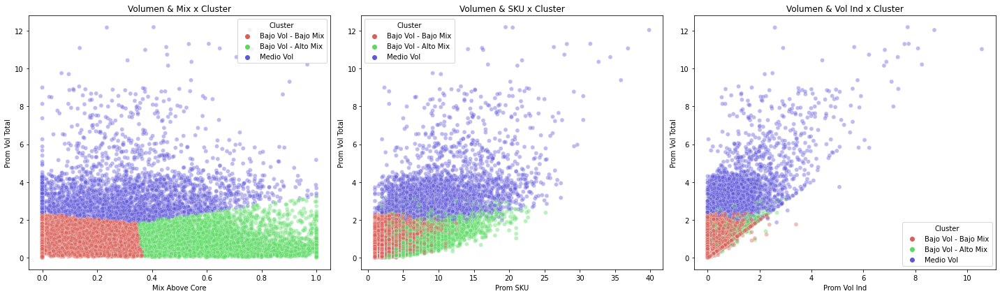

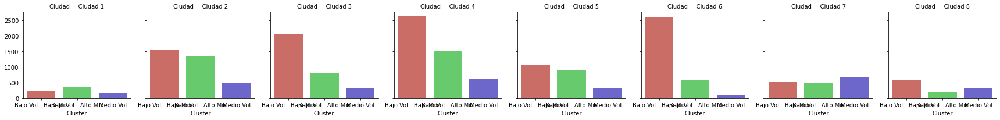

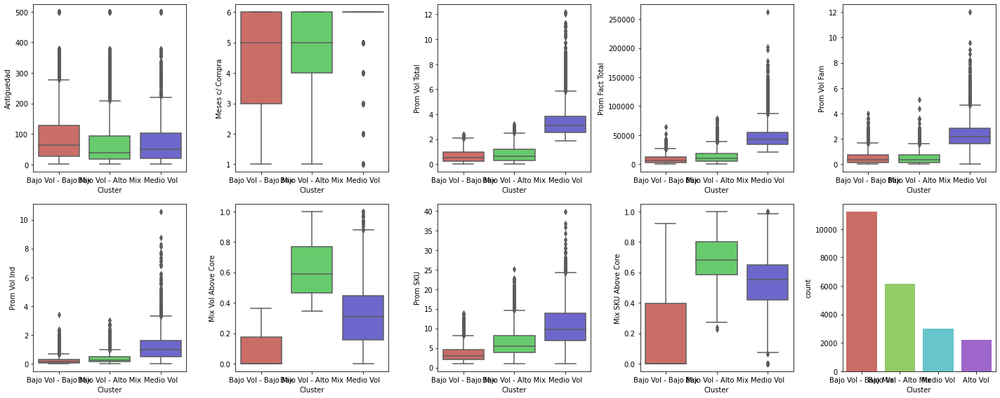

In [168]:
clusters = cluster_automatico('Base_Venta','Base_Clientes')

#### Para finalizar se exporta el modelo a un archivo pickle

In [169]:
with open('modelo.pkl', 'wb') as Clustering:
    pickle.dump(pipeline_kmeans, Clustering)

#### Verifico poder leerlo y realizar .predict

In [170]:
with open('../Desafío 4/modelo.pkl', 'rb') as Clustering:
    model_from_disk = pickle.load(Clustering)

In [171]:
model_from_disk.predict(dataset)

array([2, 2, 2, ..., 1, 1, 1])